# IPUMS NHIS Dataset

This sub-repository contains the Python notebooks for the tutorial "Survival of the Fittest: Classical and Machine Learning Methods for Time-to-Event Modeling" of D. Meier and A. Sturge for the Data Science Working Group of the Swiss Actuarial Association, see https://actuarialdatascience.org.

We start by loading NHIS data from https://nhis.ipums.org/nhis/

In [1]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import lightgbm as lgb
import shap
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import log_loss
from sksurv.ensemble import RandomSurvivalForest
from lifelines import CoxPHFitter
import plotly.graph_objects as go
import sys
import importlib

modules = [
    'polars',
    'pandas',
    'seaborn',
    'matplotlib',
    'numpy',
    'lightgbm',
    'shap',
    'lifelines',
    'sksurv',
    'sklearn'
]

print(f"Python version: {sys.version}\n")

for module in modules:
    try:
        mod = importlib.import_module(module)
        version = getattr(mod, '__version__', 'built-in or no __version__')
        print(f"{module} version: {version}")
    except ImportError:
        print(f"{module} is not installed.")

sns.set()

# Providing a schema for the NHIS import since some data types are not correctly detected by Polars

schema = pl.Schema(
    [
        ("YEAR", pl.Int64()),
        ("SERIAL", pl.Int64()),
        ("STRATA", pl.Int64()),
        ("PSU", pl.Int64()),
        ("NHISHID", pl.String),
        ("HHWEIGHT", pl.Int64()),
        ("REGION", pl.Int64()),
        ("URBRRL", pl.Int64()),
        ("PERNUM", pl.Int64()),
        ("NHISPID", pl.String),
        ("HHX", pl.String),
        ("FMX", pl.String),
        ("PX", pl.Int64()),
        ("PERWEIGHT", pl.Float64()),
        ("SAMPWEIGHT", pl.Float64()),
        ("LONGWEIGHT", pl.Float64()),
        ("PARTWEIGHT", pl.Float64()),
        ("FWEIGHT", pl.Int64()),
        ("SUPP1WT", pl.Int64()),
        ("ASTATFLG", pl.Int64()),
        ("CSTATFLG", pl.Int64()),
        ("ASTATQCFLAG", pl.Int64()),
        ("SAPROXYAVAIL", pl.Int64()),
        ("AGE", pl.Int64()),
        ("SEX", pl.Int64()),
        ("MARSTCUR", pl.Int64()),
        ("MARSTLEG", pl.Int64()),
        ("MARSTAT", pl.Int64()),
        ("MARST", pl.Int64()),
        ("FAMKIDNO", pl.Int64()),
        ("RACENEW", pl.Int64()),
        ("HISPETH", pl.Int64()),
        ("HISPYN", pl.Int64()),
        ("USBORN", pl.Int64()),
        ("CITIZEN", pl.Int64()),
        ("EDUC", pl.Int64()),
        ("IND", pl.Int64()),
        ("HOURSWRK", pl.Int64()),
        ("CPI2009", pl.Float64()),
        ("EARNINGS", pl.Int64()),
        ("EARNIMP1", pl.Int64()),
        ("EARNIMP2", pl.Int64()),
        ("EARNIMP3", pl.Int64()),
        ("EARNIMP4", pl.Int64()),
        ("EARNIMP5", pl.Int64()),
        ("EARNIMPOINT1", pl.Int64()),
        ("EARNIMPOINT2", pl.Int64()),
        ("EARNIMPOINT3", pl.Int64()),
        ("EARNIMPOINT4", pl.Int64()),
        ("EARNIMPOINT5", pl.Int64()),
        ("OWNERSHIP", pl.Int64()),
        ("BMICALC", pl.Float64()),
        ("BMICAT", pl.Int64()),
        ("HINOTCOVE", pl.Int64()),
        ("HIPRIVATEE", pl.Int64()),
        ("HIMCAIDE", pl.Int64()),
        ("HIMCAREE", pl.Int64()),
        ("HIPRIVATE", pl.Int64()),
        ("VACFLU12M", pl.Int64()),
        ("ALCAMT", pl.Int64()),
        ("ALCDAYSWK", pl.Int64()),
        ("ALCDAYSYR", pl.Int64()),
        ("CIGSDAY1", pl.Int64()),
        ("CIGSDAY2", pl.Int64()),
        ("SMOKESTATUS2", pl.Int64()),
        ("MOD10DMIN", pl.Int64()),
        ("MOD10DNO", pl.Int64()),
        ("MOD10DTP", pl.Int64()),
        ("MOD10FNO", pl.Int64()),
        ("MOD10FTP", pl.Int64()),
        ("MOD10FWK", pl.Int64()),
        ("VIG10DMIN", pl.Int64()),
        ("VIG10DNO", pl.Int64()),
        ("VIG10DTP", pl.Int64()),
        ("VIG10FNO", pl.Int64()),
        ("VIG10FTP", pl.Int64()),
        ("VIG10FWK", pl.Int64()),
        ("STRONGFNO", pl.Int64()),
        ("STRONGFTP", pl.Int64()),
        ("STRONGFWK", pl.Int64()),
        ("HRSLEEP", pl.Int64()),
        ("AEFFORT", pl.Int64()),
        ("AFEELINT1MO", pl.Int64()),
        ("AHOPELESS", pl.Int64()),
        ("ANERVOUS", pl.Int64()),
        ("ARESTLESS", pl.Int64()),
        ("ASAD", pl.Int64()),
        ("AWORTHLESS", pl.Int64()),
        ("ANXIETYEV", pl.Int64()),
        ("WORFREQ", pl.Int64()),
        ("WORRX", pl.Int64()),
        ("WORFEELEVL", pl.Int64()),
        ("DEPFREQ", pl.Int64()),
        ("DEPRX", pl.Int64()),
        ("DEPFEELEVL", pl.Int64()),
        ("MORTSTAT", pl.Int64()),
        ("MORTDODY", pl.Int64()),
        ("MORTUCODLD", pl.Int64()),
        ("MORTWT", pl.Int64()),
        ("MORTWTSA", pl.Int64()),
    ]
)

df = pl.read_csv("data/nhis_00010.csv.gz", schema=schema)

print(df)

Python version: 3.9.21 (main, Dec 11 2024, 10:23:52) 
[Clang 14.0.6 ]

polars version: 1.29.0
pandas version: 1.5.3
seaborn version: 0.13.2
matplotlib version: 3.9.2
numpy version: 1.26.4
lightgbm version: 4.6.0
shap version: 0.47.2
lifelines version: 0.26.4
sksurv version: 0.21.0
sklearn version: 1.2.2
shape: (2_314_002, 100)
┌──────┬────────┬────────┬─────┬───┬──────────┬────────────┬────────┬──────────┐
│ YEAR ┆ SERIAL ┆ STRATA ┆ PSU ┆ … ┆ MORTDODY ┆ MORTUCODLD ┆ MORTWT ┆ MORTWTSA │
│ ---  ┆ ---    ┆ ---    ┆ --- ┆   ┆ ---      ┆ ---        ┆ ---    ┆ ---      │
│ i64  ┆ i64    ┆ i64    ┆ i64 ┆   ┆ i64      ┆ i64        ┆ i64    ┆ i64      │
╞══════╪════════╪════════╪═════╪═══╪══════════╪════════════╪════════╪══════════╡
│ 1996 ┆ 1      ┆ 4049   ┆ 3   ┆ … ┆ 9999     ┆ 96         ┆ 3767   ┆ null     │
│ 1996 ┆ 1      ┆ 4049   ┆ 3   ┆ … ┆ 1998     ┆ 8          ┆ 3688   ┆ null     │
│ 1996 ┆ 1      ┆ 4049   ┆ 3   ┆ … ┆ 9999     ┆ 96         ┆ 3712   ┆ null     │
│ 1996 ┆ 1      ┆ 4049 

# 1 Data exploration and engineering

Analysing distributions/histograms, missing/unknown values, mapping integer to string values for categorical variables, definition of mortality target variable, comparison against mortality benchmark, etc.

In [2]:
# Summary statistics of the NHIS dataset

df.describe(
    percentiles=[0.1, 0.3, 0.5, 0.7, 0.9],
    interpolation="linear",
)

statistic,YEAR,SERIAL,STRATA,PSU,NHISHID,HHWEIGHT,REGION,URBRRL,PERNUM,NHISPID,HHX,FMX,PX,PERWEIGHT,SAMPWEIGHT,LONGWEIGHT,PARTWEIGHT,FWEIGHT,SUPP1WT,ASTATFLG,CSTATFLG,ASTATQCFLAG,SAPROXYAVAIL,AGE,SEX,MARSTCUR,MARSTLEG,MARSTAT,MARST,FAMKIDNO,RACENEW,HISPETH,HISPYN,USBORN,CITIZEN,EDUC,…,CIGSDAY2,SMOKESTATUS2,MOD10DMIN,MOD10DNO,MOD10DTP,MOD10FNO,MOD10FTP,MOD10FWK,VIG10DMIN,VIG10DNO,VIG10DTP,VIG10FNO,VIG10FTP,VIG10FWK,STRONGFNO,STRONGFTP,STRONGFWK,HRSLEEP,AEFFORT,AFEELINT1MO,AHOPELESS,ANERVOUS,ARESTLESS,ASAD,AWORTHLESS,ANXIETYEV,WORFREQ,WORRX,WORFEELEVL,DEPFREQ,DEPRX,DEPFEELEVL,MORTSTAT,MORTDODY,MORTUCODLD,MORTWT,MORTWTSA
str,f64,f64,f64,f64,str,f64,f64,f64,f64,str,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""count""",2.314002e6,2.314002e6,2.314002e6,2.314002e6,"""2314002""",2.125382e6,2.314002e6,188620.0,2.314002e6,"""2314002""","""2250600""","""2061980""",2.125382e6,2.125382e6,2.2506e6,37358.0,37358.0,2.06198e6,1.707962e6,2.2506e6,2.2506e6,1.219778e6,1.371258e6,2.314002e6,2.314002e6,2.2506e6,2.314002e6,2.276788e6,2.276788e6,2.2506e6,2.048338e6,2.314002e6,2.2506e6,2.2506e6,2.147123e6,2.2506e6,…,2.2506e6,2.2506e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,2.134453e6,1.44822e6,2.099723e6,2.06198e6,2.099723e6,2.099723e6,2.099723e6,2.099723e6,2.099723e6,188620.0,1.057096e6,1.057096e6,1.057096e6,1.057096e6,1.057096e6,1.057096e6,2.125382e6,2.125382e6,2.125382e6,1.773461e6,2.06198e6
"""null_count""",0.0,0.0,0.0,0.0,"""0""",188620.0,0.0,2.125382e6,0.0,"""0""","""63402""","""252022""",188620.0,188620.0,63402.0,2.276644e6,2.276644e6,252022.0,606040.0,63402.0,63402.0,1.094224e6,942744.0,0.0,0.0,63402.0,0.0,37214.0,37214.0,63402.0,265664.0,0.0,63402.0,63402.0,166879.0,63402.0,…,63402.0,63402.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,179549.0,865782.0,214279.0,252022.0,214279.0,214279.0,214279.0,214279.0,214279.0,2.125382e6,1.256906e6,1.256906e6,1.256906e6,1.256906e6,1.256906e6,1.256906e6,188620.0,188620.0,188620.0,540541.0,252022.0
"""mean""",2008.166788,21924.607506,5334.709597,7.2492,null,2679.445066,2.711446,2.313763,2.132154,null,null,null,2.211529,3188.919925,3619.541245,6716.541918,6746.93635,2976.792483,1779.338729,1.425011,0.507761,1.002038,0.011487,36.737286,1.517978,3.101112,20.807428,20.495174,20.77466,1.189257,152.04029,14.831401,1.219054,19.115174,1.968558,238.790872,…,0.092646,9.107421,10.922603,5.942473,0.248244,6734.224388,1.393637,15.884482,8.517808,4.198481,0.185792,6712.740722,1.105051,20.632917,6848.187885,0.967274,24.906972,3.261165,4.212405,0.292448,4.124116,4.241052,4.246021,4.187019,4.109633,0.937228,1.150794,0.361943,0.389517,1.322454,0.359713,0.218121,4.60903,9320.204921,88.236035,2318.192515,2377.414741
"""std""",7.373332,13768.99248,1700.587881,17.789725,null,1461.912019,1.033291,1.054078,1.367955,null,null,null,1.394312,1753.501052,5381.431433,16073.038266,9793.742495,1642.018326,6371.893816,1.187482,0.991764,0.045099,0.151265,25.754188,0.500241,3.195658,19.631513,19.72062,19.576854,1.71015,121.728181,12.074876,0.422199,7.071483,0.62029,175.261558,…,1.899694,13.461598,53.583297,46.129505,0.653928,4680.866067,8.343445,34.413857,41.561446,33.78347,0.559118,4686.725611,6.871785,38.622102,4412.43515,6.479086,41.452581,9.459524,2.654761,0.939033,2.746615,2.605944,2.606678,2.669897,2.764241,0.630403,1.940528,0.858993,0.933139,2.125361,0.860972,0.727892,3.483684,2227.320144,25.502054,2194.823192,4796.437955
"""min""",1996.0,1.0,100.0,1.0,"""00001997000308""",51.0,1.0,1.0,1.0,"""0002019H00000310""",""" 000001""","""01""",1.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,100.0,10.0,1.0,10.0,1.0,0.0

In [3]:
# Overview of null values, note that most categorical variables have special (non-null) values that represent missing/unknown data

missing_values = df.null_count()
with pl.Config(tbl_rows=100):
    print(missing_values.transpose(include_header=True))

shape: (100, 2)
┌──────────────┬──────────┐
│ column       ┆ column_0 │
│ ---          ┆ ---      │
│ str          ┆ u32      │
╞══════════════╪══════════╡
│ YEAR         ┆ 0        │
│ SERIAL       ┆ 0        │
│ STRATA       ┆ 0        │
│ PSU          ┆ 0        │
│ NHISHID      ┆ 0        │
│ HHWEIGHT     ┆ 188620   │
│ REGION       ┆ 0        │
│ URBRRL       ┆ 2125382  │
│ PERNUM       ┆ 0        │
│ NHISPID      ┆ 0        │
│ HHX          ┆ 63402    │
│ FMX          ┆ 252022   │
│ PX           ┆ 188620   │
│ PERWEIGHT    ┆ 188620   │
│ SAMPWEIGHT   ┆ 63402    │
│ LONGWEIGHT   ┆ 2276644  │
│ PARTWEIGHT   ┆ 2276644  │
│ FWEIGHT      ┆ 252022   │
│ SUPP1WT      ┆ 606040   │
│ ASTATFLG     ┆ 63402    │
│ CSTATFLG     ┆ 63402    │
│ ASTATQCFLAG  ┆ 1094224  │
│ SAPROXYAVAIL ┆ 942744   │
│ AGE          ┆ 0        │
│ SEX          ┆ 0        │
│ MARSTCUR     ┆ 63402    │
│ MARSTLEG     ┆ 0        │
│ MARSTAT      ┆ 37214    │
│ MARST        ┆ 37214    │
│ FAMKIDNO     ┆ 63402    │
│ RA

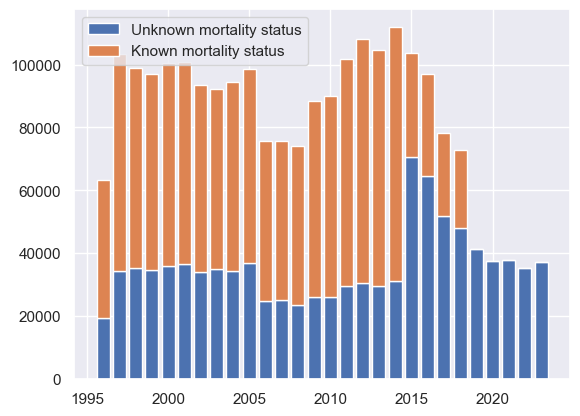

In [4]:
# Provide an overview of unkown mortality status: MORTSTAT = 9 or null denotes an unknown mortality status

unknown = df.select(["YEAR", "MORTSTAT"]).with_columns(
    ((pl.col("MORTSTAT") == 9) | (pl.col("MORTSTAT").is_null())).alias("unknown")
)
unknown = unknown.group_by("YEAR").agg(
    pl.col("unknown").sum().alias("sum_unknown"),
    pl.col("unknown").not_().sum().alias("sum_known"),
)
sns.set()
fig, ax = plt.subplots()
ax.bar(unknown["YEAR"], unknown["sum_unknown"], label="Unknown mortality status")
ax.bar(
    unknown["YEAR"],
    unknown["sum_known"],
    label="Known mortality status",
    bottom=unknown["sum_unknown"],
)
plt.legend(["Unknown mortality status", "Known mortality status"])
plt.show()

In [5]:
# Data modifications

df = df.with_columns(pl.col("VACFLU12M").fill_null(0))
df = df.with_columns(pl.col("HRSLEEP").fill_null(0))
df = df.with_columns(pl.col("WORFREQ").fill_null(0))

# Removing all rows with unknown mortality status and year < 2000

df = df.filter((pl.col("MORTSTAT") < 3) & (pl.col("YEAR") >= 2000))

# Replace HOURSWRK labels 97, 98, 99 by 0 (unknown)

df = df.with_columns(pl.col("HOURSWRK").replace(97, 0).replace(98, 0).replace(99, 0))

# Calculate income quantiles to avoid inflation adjustments of earnings

df = df.with_columns(
    pl.col("EARNIMPOINT1").rank(method="ordinal").over("YEAR").alias("rank")
)
df = df.with_columns(pl.col("rank").max().over("YEAR").alias("max_rank"))
df = df.with_columns((pl.col("rank") / pl.col("max_rank")).alias("earnings_quantile"))


# Define target variable: mortality in 2 years

death_year = 2
df = df.filter(pl.col("YEAR") <= 2018)
df = df.with_columns((pl.col("MORTSTAT") == 1).alias("event"))
df = df.with_columns((pl.col("MORTDODY") - pl.col("YEAR")).alias("time"))
df = df.with_columns(
    (pl.col("MORTDODY") - pl.col("YEAR") == death_year).alias("target")
)

df_num = df  # store original (integer) dataframe for later modelling
df_num = df_num.with_columns(
    pl.lit(1).alias("survival") # preparing to include predictions from a Cox model
)

In [6]:
# Helper function to map NHIS integer values to strings

with open("data/description.txt") as f:
    desc = f.readlines()


def mapDesc(col):
    dict = {}
    for j in range(len(desc)):
        if desc[j].startswith(col):
            while not desc[j + 1].startswith("\n"):
                j += 1
                dict[int(desc[j].split(" ")[0])] = desc[j][20 : len(desc[j]) - 1]
            break
    return dict


for col in [
    "SEX",
    "REGION",
    "MARSTAT",
    "USBORN",
    "EDUC",
    "OWNERSHIP",
    "HIPRIVATEE",
    "VACFLU12M",
    "SMOKESTATUS2",
    "HRSLEEP",
    "WORFREQ",
    "ASAD",
    "MORTUCODLD",
]:
    df = df.with_columns(pl.col(col).replace_strict(mapDesc(col)))

In [7]:
# Deriving mortality rates (death in year t+1), unweighted and weighted by MORTWT

nhis = df.filter(pl.col("MORTWT").is_not_null())
nhis = (
    (
        nhis.with_columns(
            ((pl.col("MORTDODY") - pl.col("YEAR") == 1))
            .cast(pl.Float64)
            .alias("deaths")
        )
        .with_columns(
            (pl.col("deaths") * pl.col("MORTWT")).alias("weighted_deaths")
        )
        .group_by(["YEAR", "AGE", "SEX"])
        .agg(
            pl.col("weighted_deaths").sum(),
            pl.col("MORTWT").sum(),
            pl.col("deaths").mean().alias("qx"),
        )
    )
    .with_columns(
        np.log(pl.col("weighted_deaths") / pl.col("MORTWT")).alias(
            "weighted_log_qx"
        )
    )
    .with_columns(np.log(pl.col("qx")).alias("log_qx"))
    .with_columns(pl.lit("NHIS").alias("source"))
    .select(["YEAR", "AGE", "SEX", "source", "weighted_log_qx", "log_qx"])
    .with_columns(pl.col("SEX").replace_strict({"Male": "male", "Female": "female"}))
)
print(nhis)

shape: (2_040, 6)
┌──────┬─────┬────────┬────────┬─────────────────┬───────────┐
│ YEAR ┆ AGE ┆ SEX    ┆ source ┆ weighted_log_qx ┆ log_qx    │
│ ---  ┆ --- ┆ ---    ┆ ---    ┆ ---             ┆ ---       │
│ i64  ┆ i64 ┆ str    ┆ str    ┆ f64             ┆ f64       │
╞══════╪═════╪════════╪════════╪═════════════════╪═══════════╡
│ 2006 ┆ 36  ┆ male   ┆ NHIS   ┆ -6.239316       ┆ -6.25575  │
│ 2000 ┆ 22  ┆ male   ┆ NHIS   ┆ -6.602682       ┆ -6.289716 │
│ 2009 ┆ 79  ┆ female ┆ NHIS   ┆ -3.057919       ┆ -3.228826 │
│ 2004 ┆ 53  ┆ male   ┆ NHIS   ┆ -5.09893        ┆ -5.147494 │
│ 2002 ┆ 51  ┆ male   ┆ NHIS   ┆ -4.945222       ┆ -5.103923 │
│ …    ┆ …   ┆ …      ┆ …      ┆ …               ┆ …         │
│ 2004 ┆ 47  ┆ male   ┆ NHIS   ┆ -6.92916        ┆ -6.33328  │
│ 2000 ┆ 19  ┆ female ┆ NHIS   ┆ -inf            ┆ -inf      │
│ 2007 ┆ 65  ┆ male   ┆ NHIS   ┆ -4.50429        ┆ -4.488636 │
│ 2008 ┆ 24  ┆ female ┆ NHIS   ┆ -6.412076       ┆ -6.163315 │
│ 2013 ┆ 25  ┆ female ┆ NHIS   ┆ -inf

/opt/anaconda3/lib/python3.9/site-packages/polars/series/series.py:1507: RuntimeWarning: divide by zero encountered in log
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


In [8]:
# Using mortality data from the Human Mortality Database as a benchmark for NHIS

hmd_males = pd.read_csv("data/US_males.txt", sep='\s+', header=1)
hmd_females = pd.read_csv("data/US_females.txt", sep='\s+', header=1)
hmd_both = pd.concat(
    [hmd_males.assign(SEX="male"), hmd_females.assign(SEX="female")]
).assign(source="HMD")
hmd_both = hmd_both.drop(hmd_both[hmd_both["Age"] == "110+"].index)
hmd_both = hmd_both.astype({"Age": "int64"})
hmd_both = pl.from_pandas(hmd_both)
hmd_both = hmd_both.filter(
    (pl.col("Year") >= 2000)
    & (pl.col("Year") < 2020)
    & (pl.col("Age") >= 18)
    & (pl.col("Age") <= 85)
)
hmd_both = hmd_both.with_columns(np.log(pl.col("qx")).alias("log_qx")).with_columns(
    pl.col("log_qx").alias("weighted_log_qx")
)
hmd_both = hmd_both.rename({"Year": "YEAR", "Age": "AGE"}).select(
    ["YEAR", "AGE", "SEX", "source", "weighted_log_qx", "log_qx"]
)

nhis_hmd = pl.concat([nhis, hmd_both])
nhis_hmd = nhis_hmd.with_columns(
    pl.concat_str([pl.col("source"), pl.col("SEX")], separator=" ").alias("label")
)
print(nhis_hmd)

shape: (4_760, 7)
┌──────┬─────┬────────┬────────┬─────────────────┬───────────┬─────────────┐
│ YEAR ┆ AGE ┆ SEX    ┆ source ┆ weighted_log_qx ┆ log_qx    ┆ label       │
│ ---  ┆ --- ┆ ---    ┆ ---    ┆ ---             ┆ ---       ┆ ---         │
│ i64  ┆ i64 ┆ str    ┆ str    ┆ f64             ┆ f64       ┆ str         │
╞══════╪═════╪════════╪════════╪═════════════════╪═══════════╪═════════════╡
│ 2006 ┆ 36  ┆ male   ┆ NHIS   ┆ -6.239316       ┆ -6.25575  ┆ NHIS male   │
│ 2000 ┆ 22  ┆ male   ┆ NHIS   ┆ -6.602682       ┆ -6.289716 ┆ NHIS male   │
│ 2009 ┆ 79  ┆ female ┆ NHIS   ┆ -3.057919       ┆ -3.228826 ┆ NHIS female │
│ 2004 ┆ 53  ┆ male   ┆ NHIS   ┆ -5.09893        ┆ -5.147494 ┆ NHIS male   │
│ 2002 ┆ 51  ┆ male   ┆ NHIS   ┆ -4.945222       ┆ -5.103923 ┆ NHIS male   │
│ …    ┆ …   ┆ …      ┆ …      ┆ …               ┆ …         ┆ …           │
│ 2019 ┆ 81  ┆ female ┆ HMD    ┆ -3.128121       ┆ -3.128121 ┆ HMD female  │
│ 2019 ┆ 82  ┆ female ┆ HMD    ┆ -3.015119       ┆ -3.0151

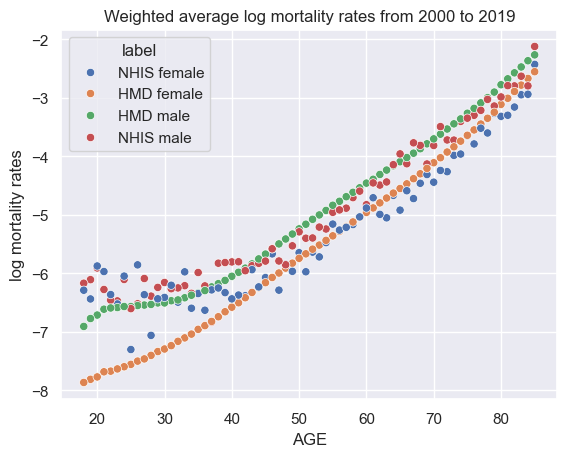

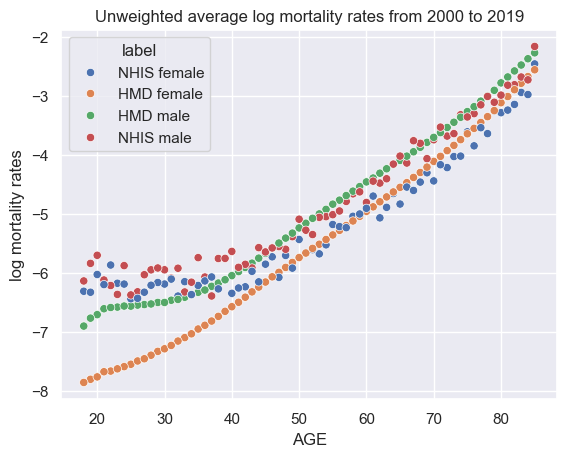

In [9]:
# Weighted and unweighted mortality rates from NHIS and HMD
# Given the good match for ages around 40 to 75, we will be working with unweighted data

avg_log_mort = nhis_hmd.filter(
    (pl.col("weighted_log_qx").is_finite()) & (pl.col("log_qx").is_finite())
)
avg_log_mort = avg_log_mort.group_by(["AGE", "label", "source"]).agg(
    pl.col("weighted_log_qx").mean(), pl.col("log_qx").mean()
)

fig, ax = plt.subplots()
plt.title("Weighted average log mortality rates from 2000 to 2019")
plt.ylabel("log mortality rates")
sns.scatterplot(avg_log_mort, x="AGE", y="weighted_log_qx", hue="label", ax=ax)

fig, ax = plt.subplots()
plt.title("Unweighted average log mortality rates from 2000 to 2019")
plt.ylabel("log mortality rates")
sns.scatterplot(avg_log_mort, x="AGE", y="log_qx", hue="label", ax=ax);

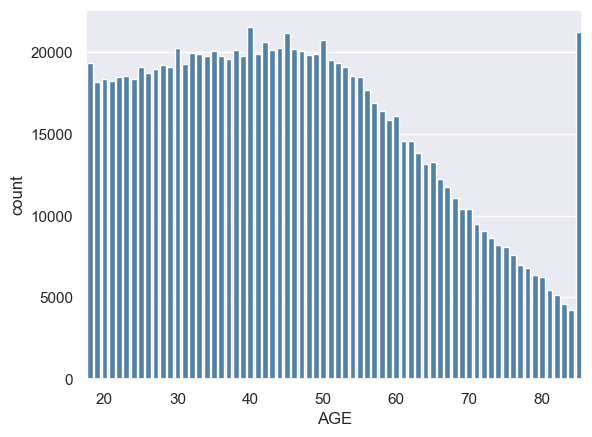

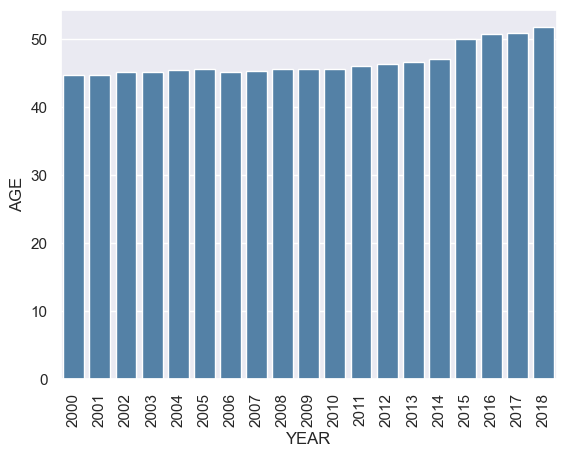

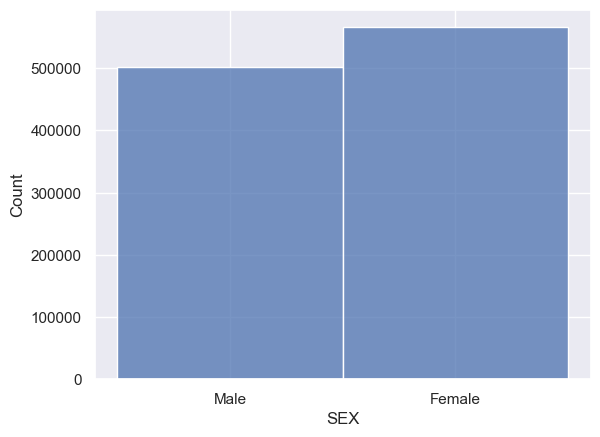

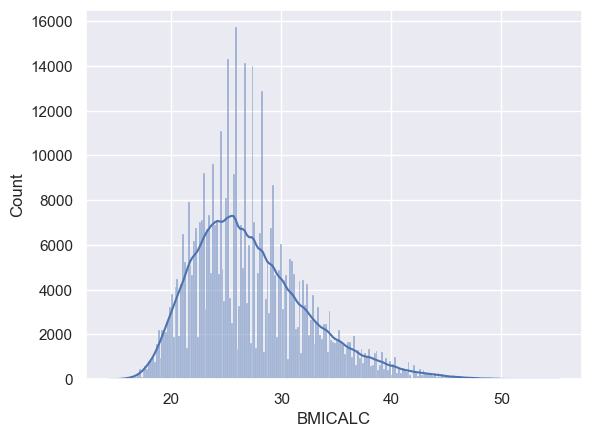

In [10]:
# Scanning through main features

# Ages 18 and 85 seem to include ages 18- and 85+
sns.barplot(
    df.group_by(pl.col("AGE")).agg(pl.count("AGE").alias("count")).to_pandas(),
    x="AGE",
    y="count",
    color="steelblue",
)
plt.xticks(np.arange(2, 63, 10))
plt.figure()
sns.barplot(
    df.group_by(pl.col("YEAR")).agg(pl.col("AGE").mean()).to_pandas(),
    x="YEAR",
    y="AGE",
    color="steelblue",
)
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="SEX")
plt.figure()
sns.histplot(
    data=df.filter((pl.col("BMICALC") > 0) & (pl.col("BMICALC") < 996)),
    x="BMICALC",
    kde=True,
);

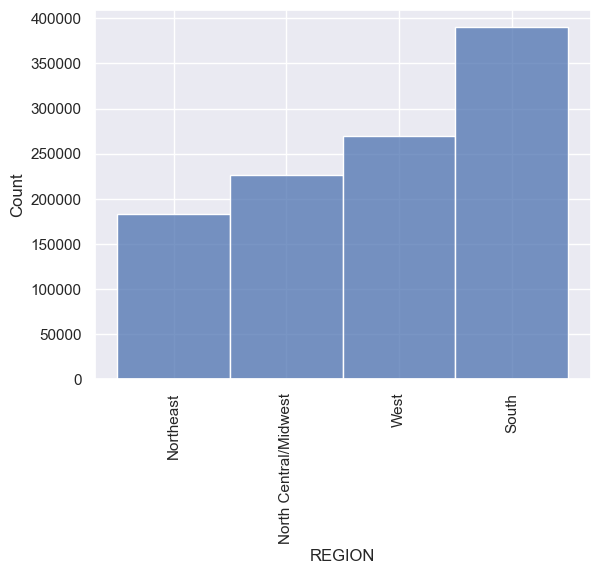

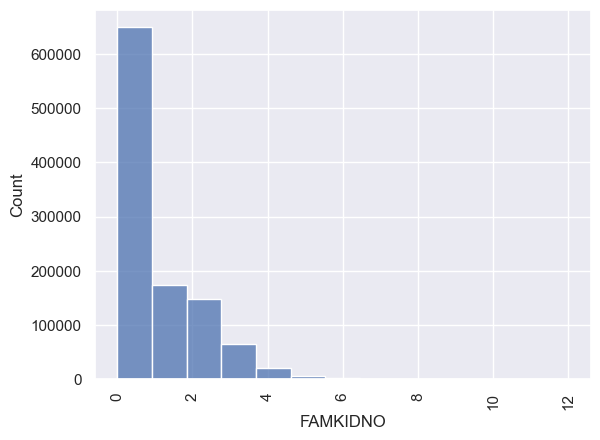

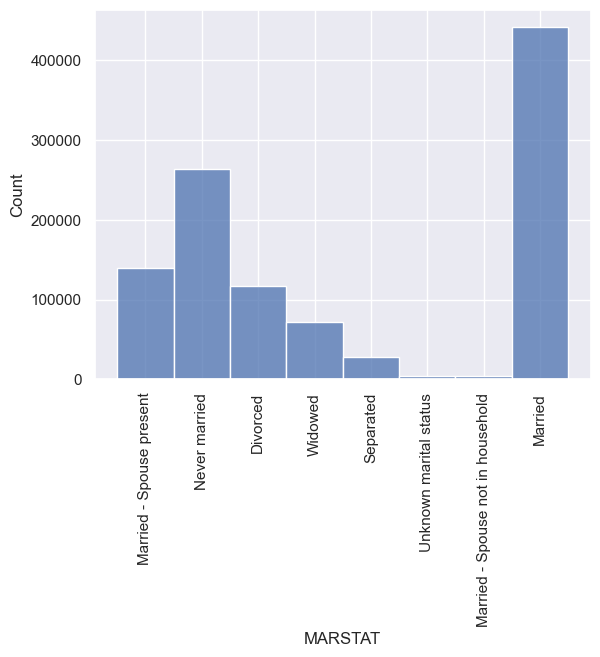

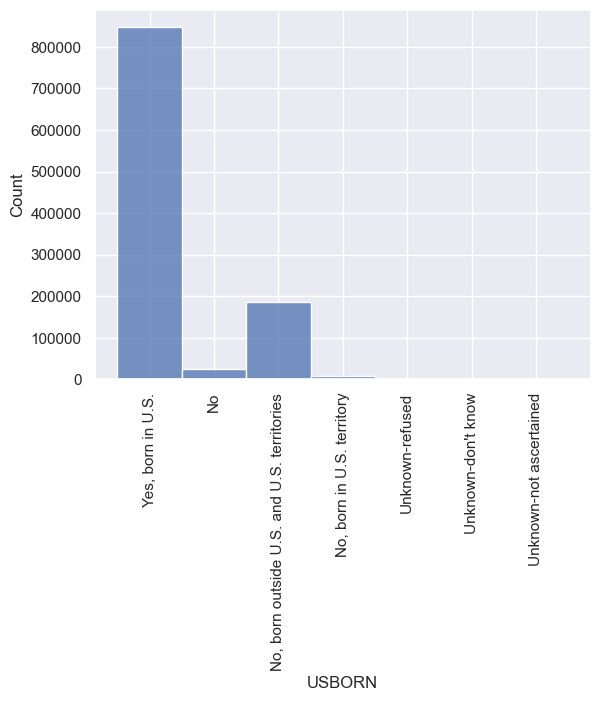

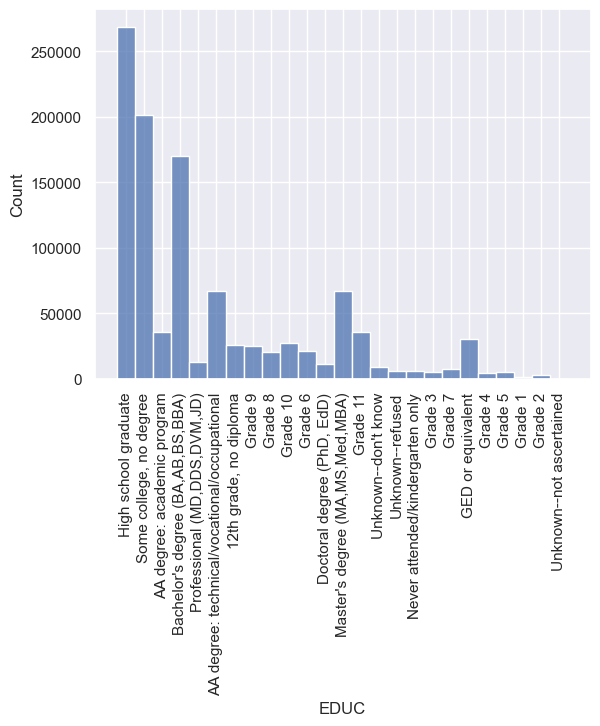

In [11]:
# Scanning through main features

sns.histplot(data=df, x="REGION", bins=4)
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="FAMKIDNO", bins=13)
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="MARSTAT")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="USBORN")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="EDUC")
plt.xticks(rotation=90);

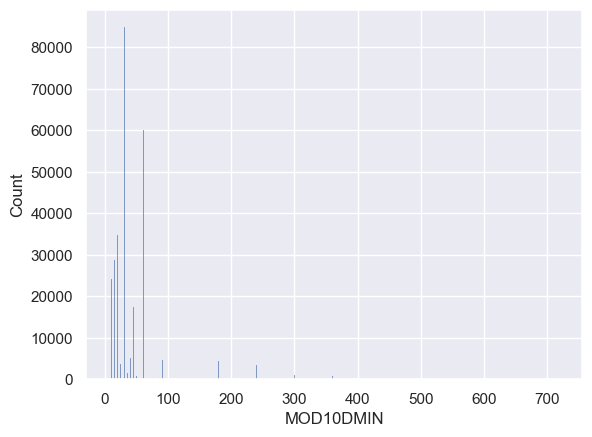

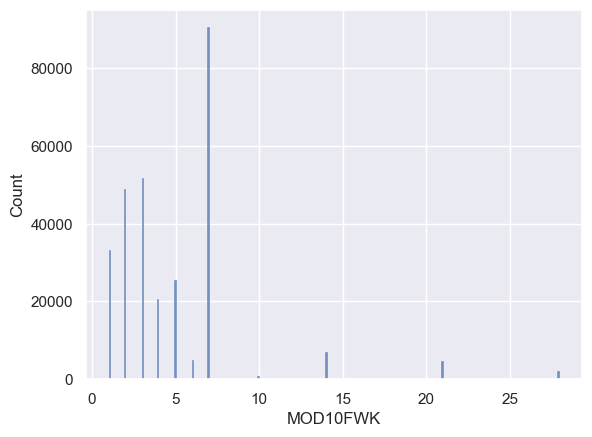

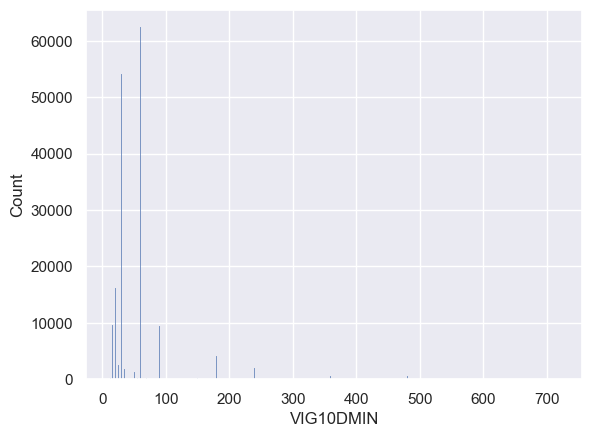

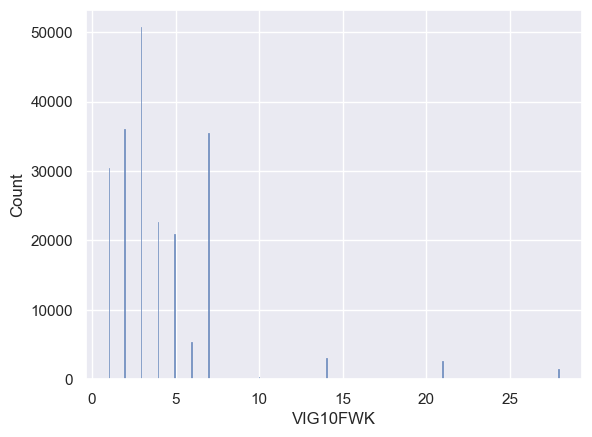

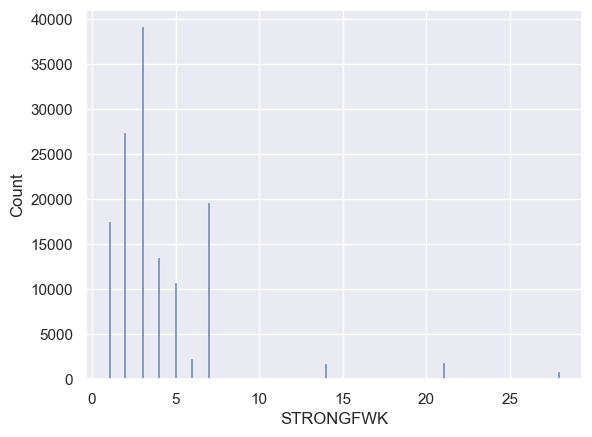

<Figure size 640x480 with 0 Axes>

In [12]:
# Scanning through main features

sns.histplot(
    data=df.filter((pl.col("MOD10DMIN") > 0) & (pl.col("MOD10DMIN") < 996)),
    x="MOD10DMIN",
)
plt.figure()
sns.histplot(
    data=df.filter((pl.col("MOD10FWK") > 0) & (pl.col("MOD10FWK") < 93)), x="MOD10FWK"
)
plt.figure()
sns.histplot(
    data=df.filter((pl.col("VIG10DMIN") > 0) & (pl.col("VIG10DMIN") < 996)),
    x="VIG10DMIN",
)
plt.figure()
sns.histplot(
    data=df.filter((pl.col("VIG10FWK") > 0) & (pl.col("VIG10FWK") < 93)), x="VIG10FWK"
)
plt.figure()
sns.histplot(
    data=df.filter((pl.col("STRONGFWK") > 0) & (pl.col("STRONGFWK") < 93)),
    x="STRONGFWK",
)
plt.figure();

<Axes: xlabel='EARNIMPOINT1', ylabel='EARNIMPOINT2'>

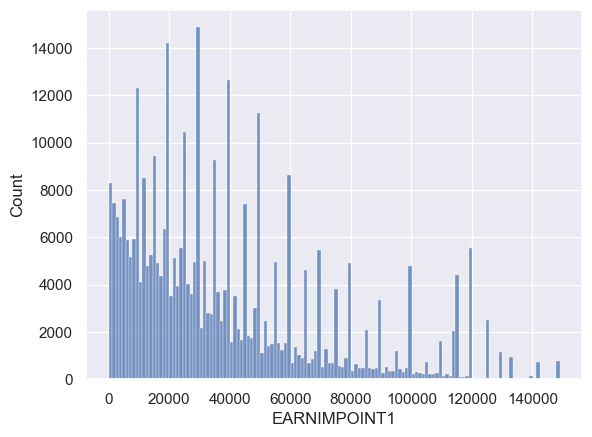

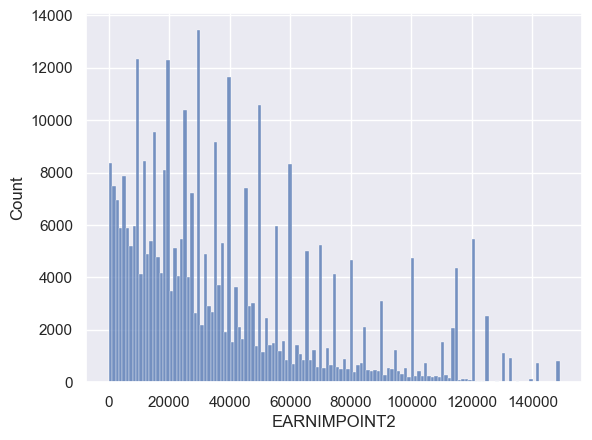

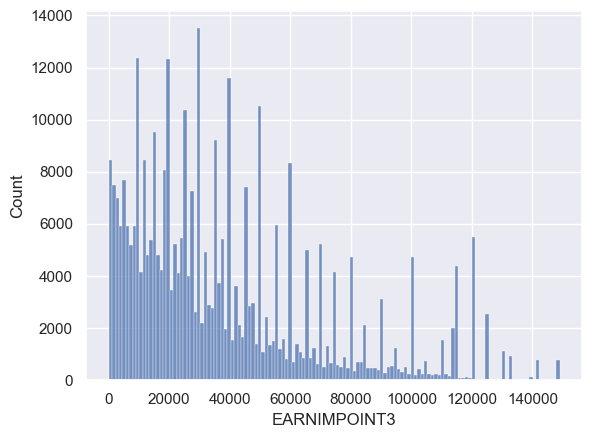

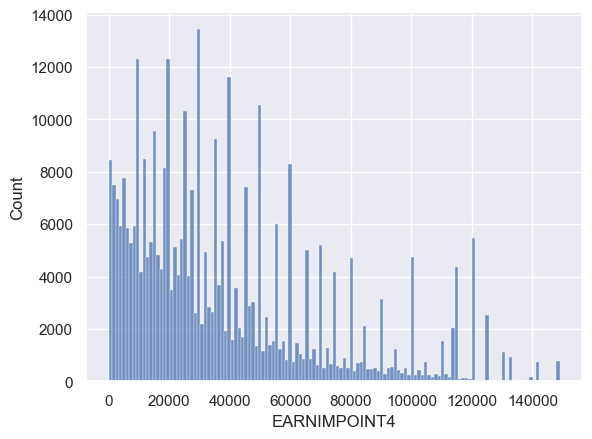

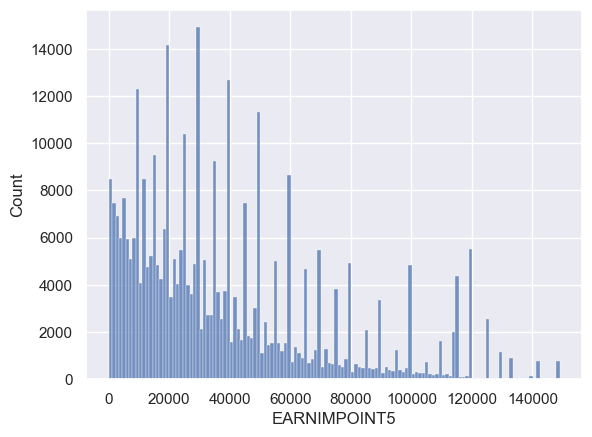

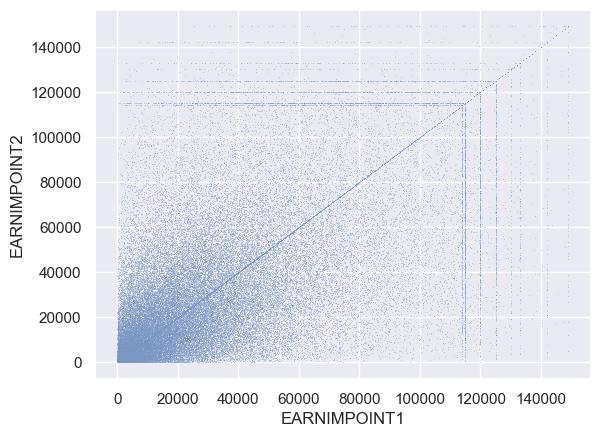

In [13]:
# Scanning through main covariates

sns.histplot(data=df.filter(pl.col("EARNIMPOINT1") > 0), x="EARNIMPOINT1")
plt.figure()
sns.histplot(data=df.filter(pl.col("EARNIMPOINT2") > 0), x="EARNIMPOINT2")
plt.figure()
sns.histplot(data=df.filter(pl.col("EARNIMPOINT3") > 0), x="EARNIMPOINT3")
plt.figure()
sns.histplot(data=df.filter(pl.col("EARNIMPOINT4") > 0), x="EARNIMPOINT4")
plt.figure()
sns.histplot(data=df.filter(pl.col("EARNIMPOINT5") > 0), x="EARNIMPOINT5")
plt.figure()
sns.scatterplot(
    data=df.filter((pl.col("EARNIMPOINT1") > 0) & (pl.col("EARNIMPOINT2") > 0)),
    x="EARNIMPOINT1",
    y="EARNIMPOINT2",
    s=0.2,
)

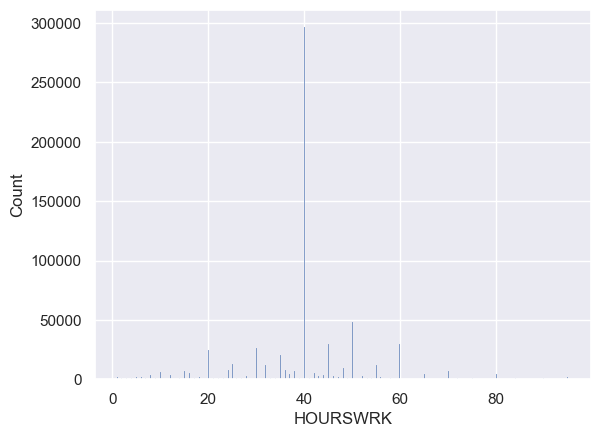

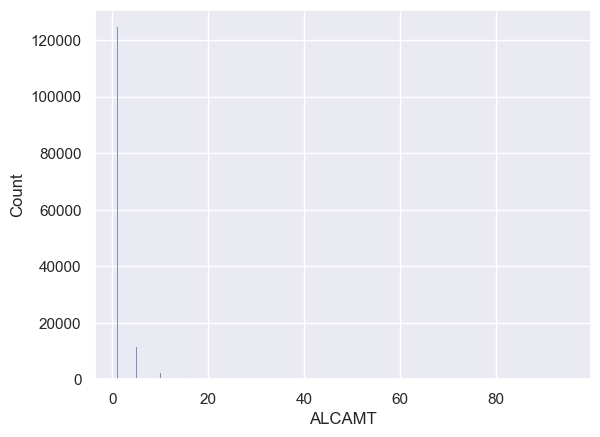

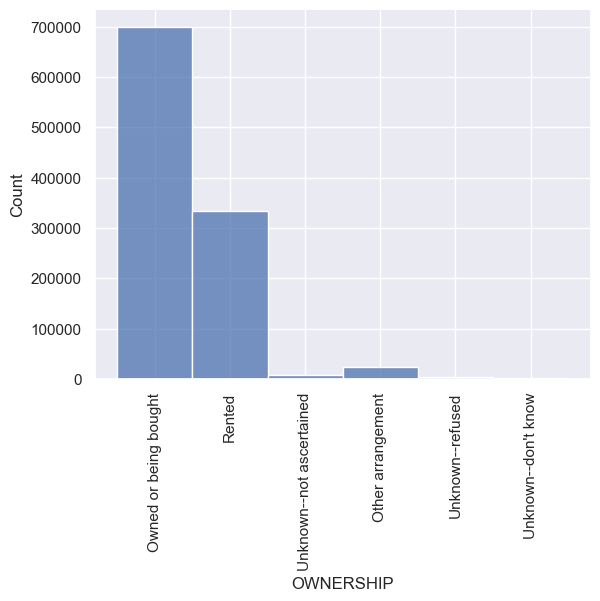

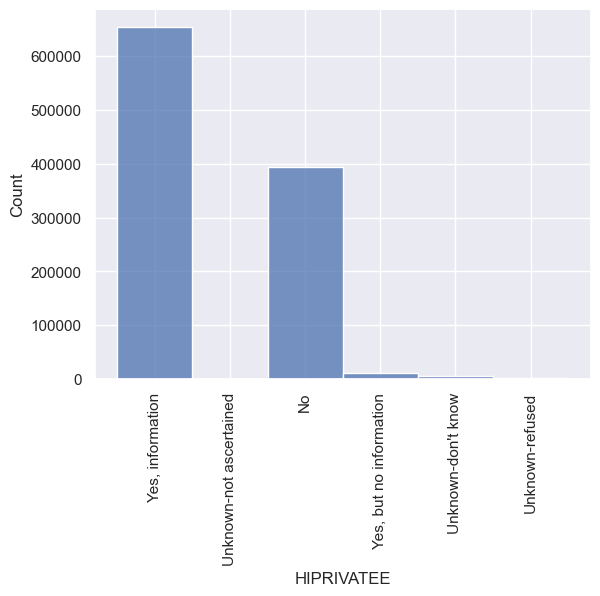

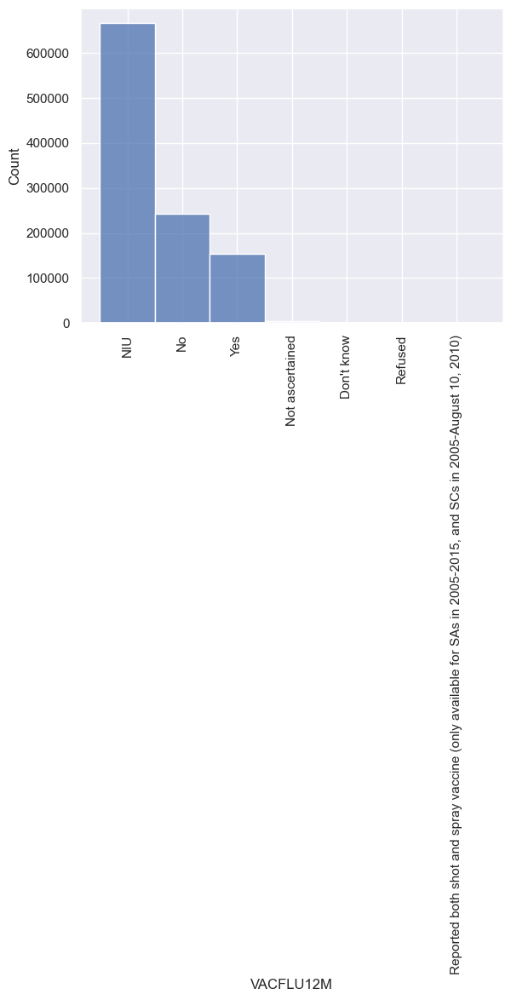

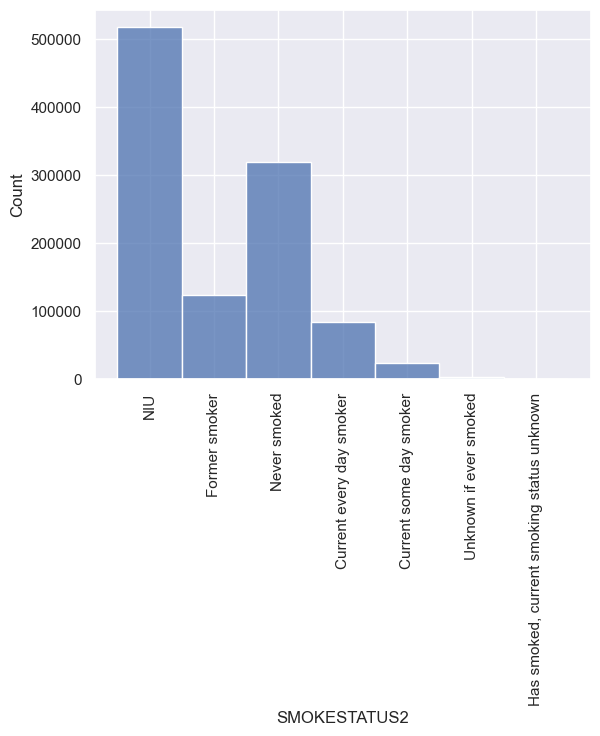

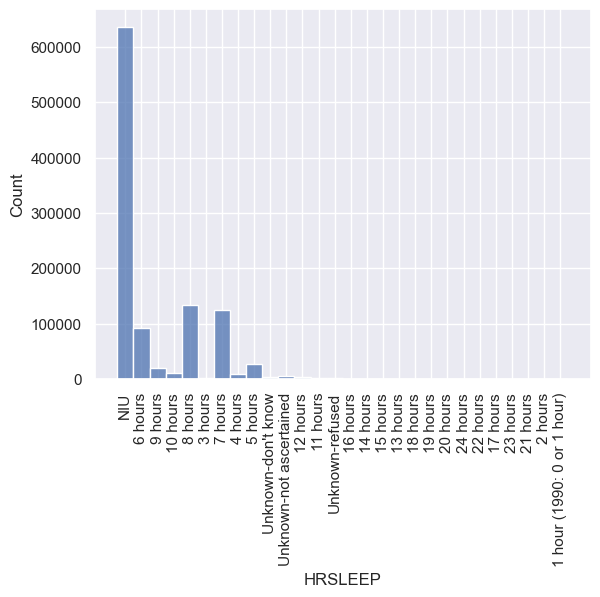

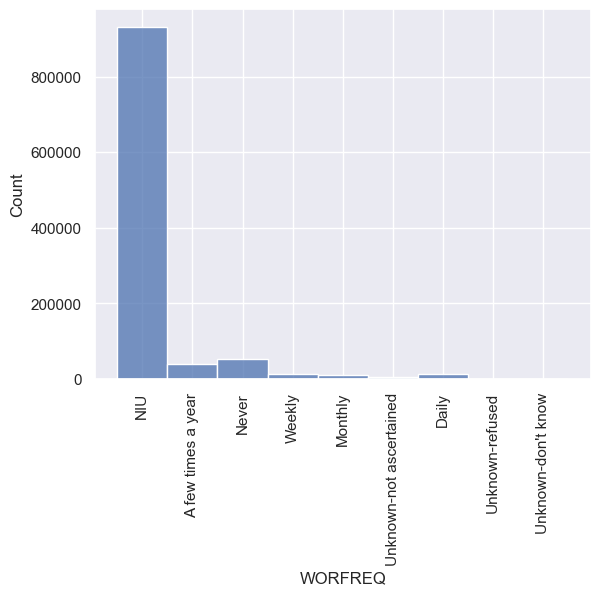

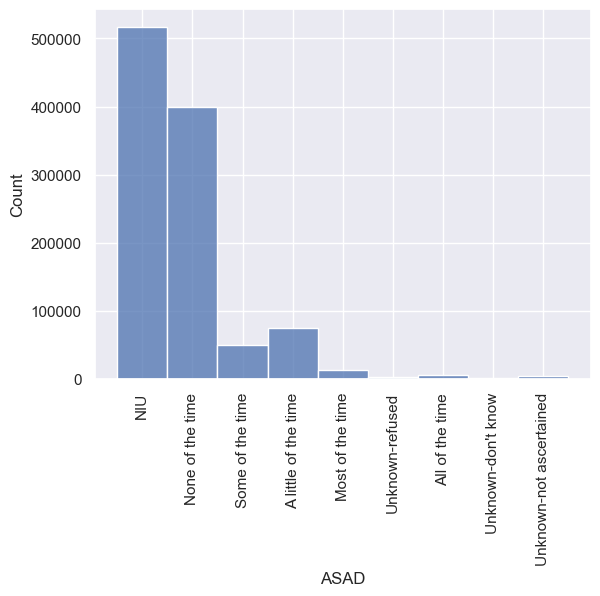

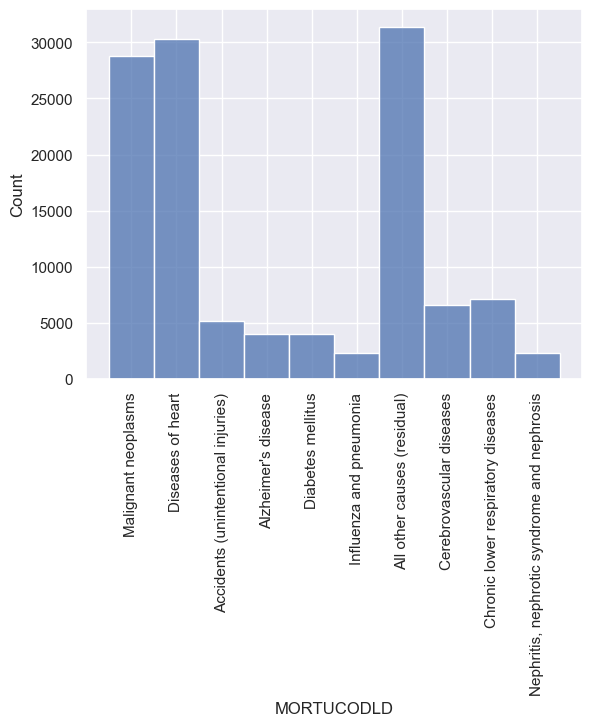

<Figure size 640x480 with 0 Axes>

In [14]:
# Scanning through main covariates

sns.histplot(data=df.filter(pl.col("HOURSWRK") > 0), x="HOURSWRK")
plt.figure()
sns.histplot(
    data=df.filter((pl.col("ALCAMT") > 0) & (pl.col("ALCAMT") < 96)), x="ALCAMT"
)
plt.figure()
sns.histplot(data=df, x="OWNERSHIP")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="HIPRIVATEE")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="VACFLU12M")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="SMOKESTATUS2")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="HRSLEEP")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="WORFREQ")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df, x="ASAD")
plt.xticks(rotation=90)
plt.figure()
sns.histplot(data=df.filter(pl.col("MORTUCODLD") != "NIU"), x="MORTUCODLD")
plt.xticks(rotation=90)
plt.figure();

# 2 First model: Gradient boosted trees

We apply the first model on the dataset, LightGBM, using (binary) mortality as target variable, starting with two covariates age and sex, and then later a larger set of covariates.

Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[67]	train's binary_logloss: 0.0432895	test's binary_logloss: 0.0448696


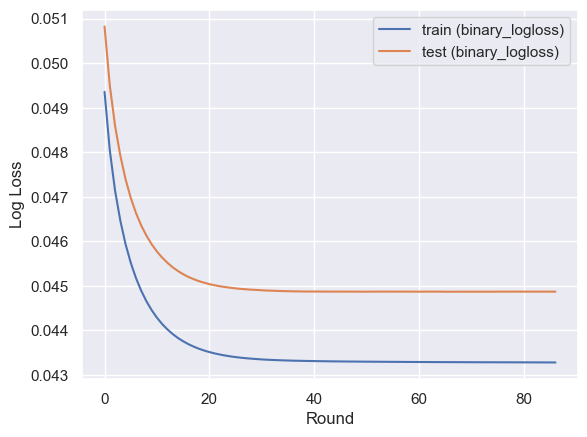

Log loss train: 0.04328954687916445
Log loss test:  0.04486961447416098


In [15]:
# LightGBM model just using age and sex as features

X = df_num.select(["AGE", "SEX"]).to_pandas()
Y = df_num.select(["target"]).to_pandas()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

params = dict(
    learning_rate=0.1,
    objective="binary",
    metric="binary_logloss",
    num_leaves=7,
    verbose=0,
    seed=0,
)

evals_result = {}
train_data = lgb.Dataset(X_train, label=Y_train)
test_data = lgb.Dataset(X_test, label=Y_test)

lgb_model = lgb.train(
    params,
    train_set=train_data,
    valid_sets=[train_data, test_data],
    valid_names=["train", "test"],
    num_boost_round=200,
    callbacks=[
        lgb.early_stopping(stopping_rounds=20),
        lgb.record_evaluation(evals_result),
    ],
)

for dataset in evals_result.keys():
    metric_values = evals_result[dataset]["binary_logloss"]
    plt.plot(metric_values, label=f"{dataset} (binary_logloss)")
plt.xlabel("Round")
plt.ylabel("Log Loss")
plt.legend()
plt.show()

print("Log loss train: " + str(log_loss(Y_train, lgb_model.predict(X_train))))
print("Log loss test:  " + str(log_loss(Y_test, lgb_model.predict(X_test))))

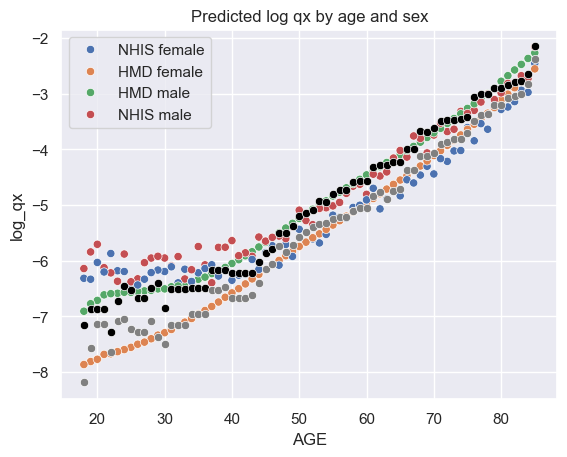

In [16]:
# Comparing predictions against NHIS and HMD mortality rates

X_male = pl.DataFrame({"AGE": np.arange(18, 86), "SEX": np.ones(68)}).to_pandas()
X_male["log_qx"] = np.log(lgb_model.predict(X_male))

X_female = pl.DataFrame({"AGE": np.arange(18, 86), "SEX": np.ones(68) * 2}).to_pandas()
X_female["log_qx"] = np.log(lgb_model.predict(X_female))

plt.title("Predicted log qx by age and sex")
sns.scatterplot(avg_log_mort, x="AGE", y="log_qx", hue="label")
sns.scatterplot(X_male, x="AGE", y="log_qx", color="black")
sns.scatterplot(X_female, x="AGE", y="log_qx", color="grey");

In [17]:
# Full list of used features

features = [
    "AGE",
    "YEAR",
    "REGION",
    "SEX",
    "BMICALC",
    "SMOKESTATUS2",
    "USBORN",
    "OWNERSHIP",
    "HIPRIVATEE",
    "HOURSWRK",
    "VACFLU12M",
    "HRSLEEP",
    "WORFREQ",
    "ASAD",
    "FAMKIDNO",
    "MARSTAT",
    "EDUC",
    "earnings_quantile",
    "ALCAMT",
    "DEPFEELEVL",
    "DEPRX",
    "DEPFREQ",
    "WORFEELEVL",
    "WORRX",
    "AWORTHLESS",
    "ARESTLESS",
    "ANERVOUS",
    "AHOPELESS",
    "AFEELINT1MO",
    "AEFFORT",
    "MOD10DMIN",
    "MOD10FWK",
    "VIG10DMIN",
    "VIG10FWK",
    "STRONGFWK",
]
categorical_features = [
    "REGION",
    "SEX",
    "SMOKESTATUS2",
    "USBORN",
    "OWNERSHIP",
    "HIPRIVATEE",
    "VACFLU12M",
    "WORFREQ",
    "ASAD",
    "MARSTAT",
    "EDUC",
    "DEPFEELEVL",
    "DEPRX",
    "DEPFREQ",
    "WORFEELEVL",
    "WORRX",
    "AWORTHLESS",
    "ARESTLESS",
    "ANERVOUS",
    "AHOPELESS",
    "AFEELINT1MO",
    "AEFFORT",
]

# Reserving a column for survival probabilties from a Cox model, see later

df_num = df_num.with_columns(pl.lit(1).alias("survival"))
X = df_num.select(features + ["survival"]).to_pandas()
Y = df_num.select(["target"]).to_pandas()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [26]:
# Grid search for hyperparameter tuning

lgb_model = lgb.LGBMRegressor()

grid_params = {
    "learning_rate": [0.01, 0.025, 0.05],
    "n_estimators": [250, 350, 450],
    "num_leaves": [6, 8, 10],
    "boosting_type": ["gbdt"],
    "objective": ["binary"],
    "metric": ["binary_logloss"],
    "random_state": [0],
    "verbose": [-1]
}

grid = GridSearchCV(lgb_model, grid_params, verbose=0, cv=4, n_jobs=-1)

grid.fit(X_train, Y_train)

print(grid.best_params_)
print(grid.best_score_)

/opt/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'boosting_type': 'gbdt', 'learning_rate': 0.025, 'metric': 'binary_logloss', 'n_estimators': 450, 'num_leaves': 10, 'objective': 'binary', 'random_state': 0, 'verbose': -1}
0.04162765989867179


Training until validation scores don't improve for 100 rounds
Did not meet early stopping. Best iteration is:
[903]	train's binary_logloss: 0.0400847	test's binary_logloss: 0.0430873


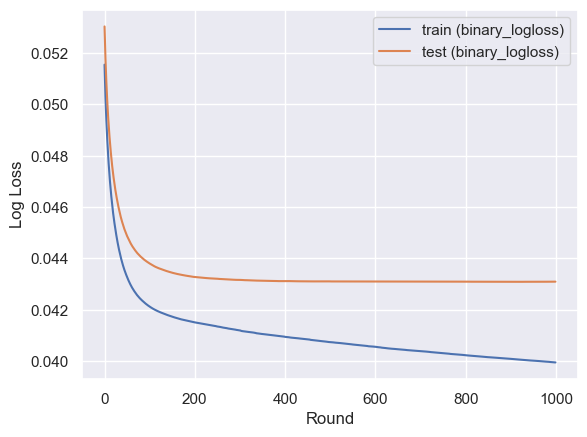

Log loss train: 0.04008473986563185
Log loss test:  0.0430872789640751


In [27]:
# Final model hyperparameters

params = dict(
    learning_rate=0.025,
    n_estimators=1000,
    objective="binary",
    metric="binary_logloss",
    num_leaves=8,
    verbose=-1,
    seed=0,
)

evals_result = {}
train_data = lgb.Dataset(X_train, label=Y_train)
test_data = lgb.Dataset(X_test, label=Y_test)

lgb_model = lgb.train(
    params,
    train_set=train_data,
    valid_sets=[train_data, test_data],
    valid_names=["train", "test"],
    num_boost_round=500,
    callbacks=[
        lgb.early_stopping(stopping_rounds=100),
        lgb.record_evaluation(evals_result)
    ],
)

for dataset in evals_result.keys():
    metric_values = evals_result[dataset]["binary_logloss"]
    plt.plot(metric_values, label=f"{dataset} (binary_logloss)")
plt.xlabel("Round")
plt.ylabel("Log Loss")
plt.legend()
plt.show()

print("Log loss train: " + str(log_loss(Y_train, lgb_model.predict(X_train))))
print("Log loss test:  " + str(log_loss(Y_test, lgb_model.predict(X_test))))

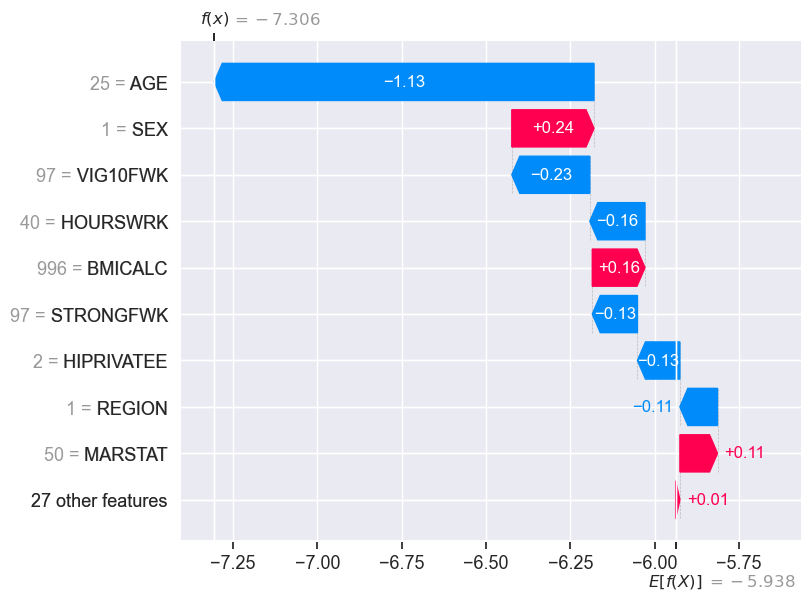

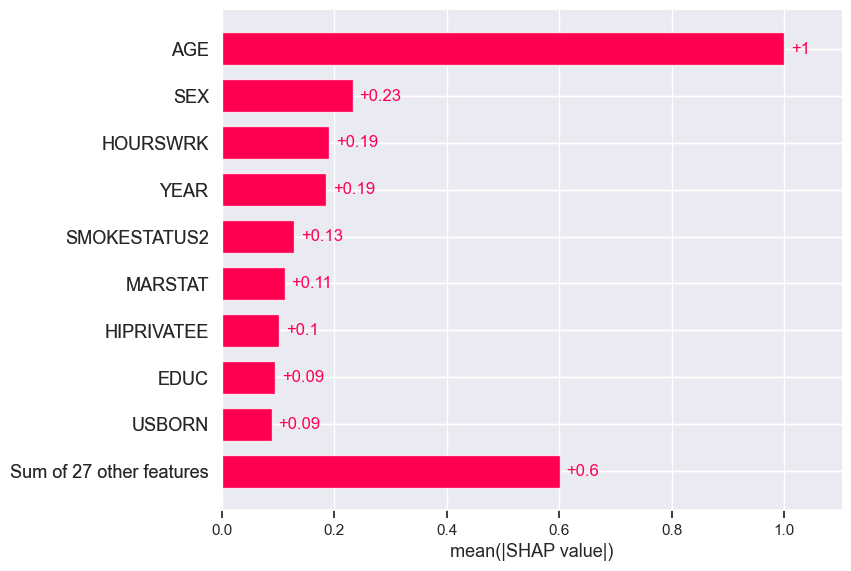

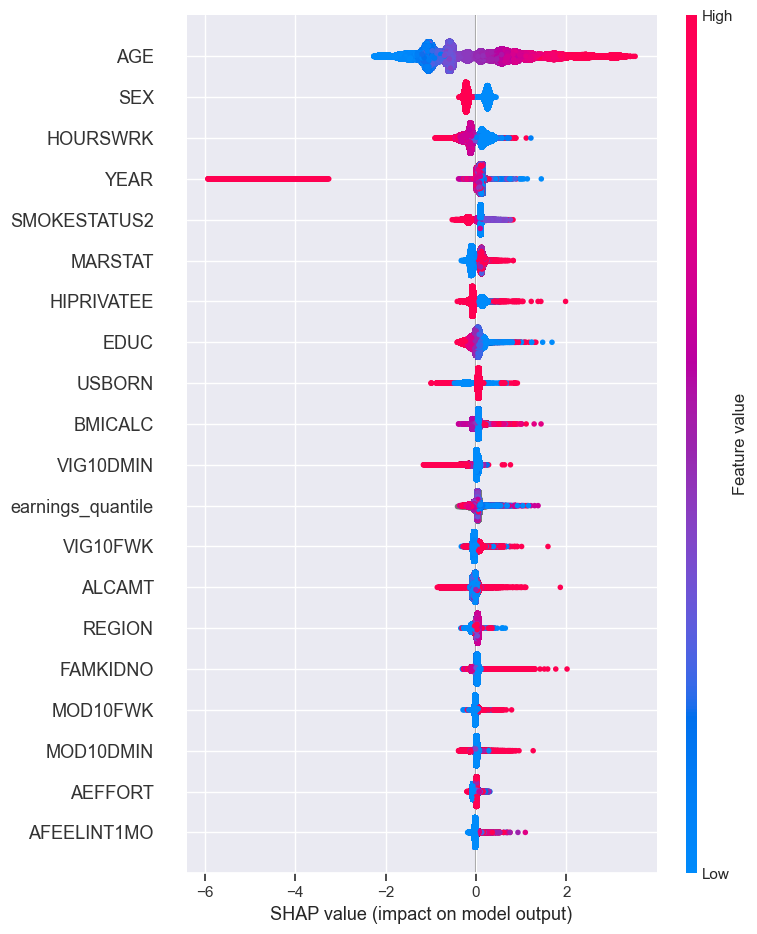

In [28]:
# SHAP

lgb_explainer = shap.Explainer(lgb_model)
shap_lgb = lgb_explainer(X_train)
shap.plots.waterfall(shap_lgb[0])
shap.plots.bar(shap_lgb)
shap.summary_plot(shap_lgb, X_train)

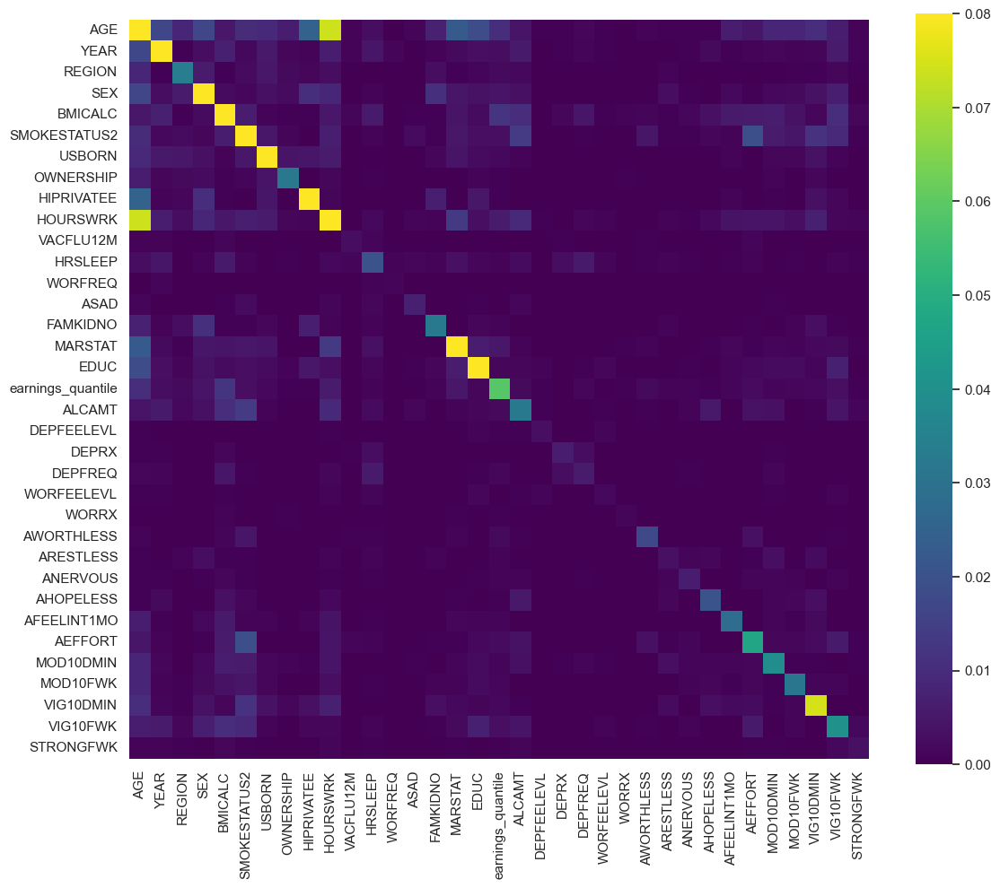

In [29]:
shap_interaction_vals = lgb_explainer.shap_interaction_values(X_train)
mean_abs_interactions = np.abs(shap_interaction_vals).mean(0)[:-1,:-1]
df_inter = pd.DataFrame(mean_abs_interactions, index=X_train.columns[:-1], columns=X_train.columns[:-1])
plt.figure(figsize=(12, 10))
sns.heatmap(df_inter, cmap="viridis", vmin=0, vmax=0.08, square=True)
plt.tight_layout()
plt.show()

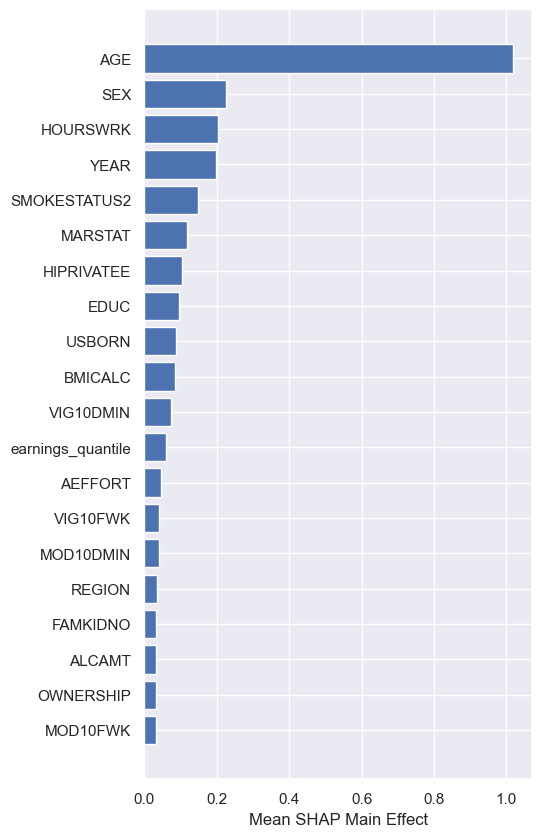

In [30]:
main_effects = pd.Series(
    np.diag(df_inter.values),
    index=X_train.columns[:-1],
    name="Main Effect"
).sort_values(ascending=False)

plt.figure(figsize=(5, 10))
plt.barh(range(20), main_effects.head(20).values)
plt.yticks(range(20), main_effects.head(20).index)
plt.xlabel("Mean SHAP Main Effect")
plt.gca().invert_yaxis()
plt.show()

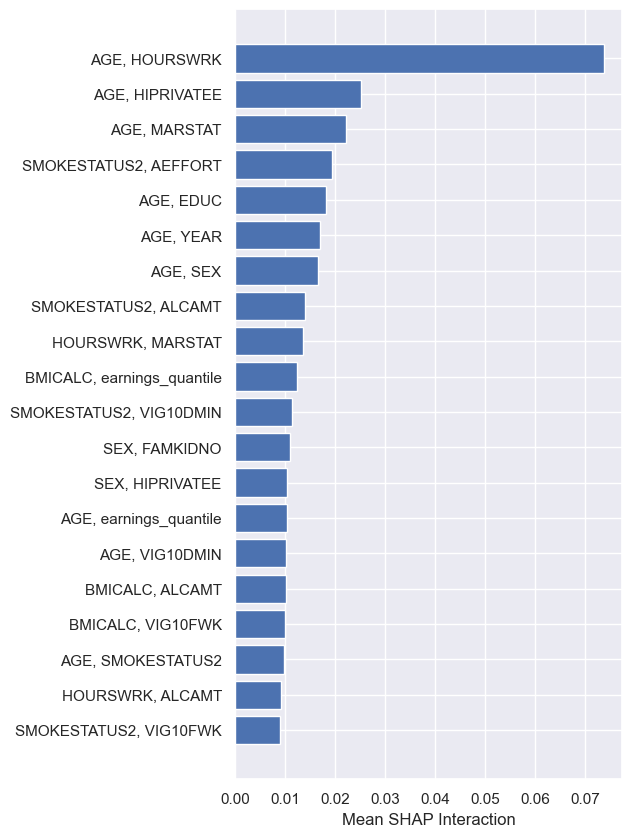

In [31]:
mask = np.triu(np.ones_like(df_inter, dtype=bool), k=1)
interaction_pairs = []

for i in range(len(X_train.columns)-1):
    for j in range(i+1, len(X_train.columns)-1):
        interaction_pairs.append((X_train.columns[i] + ", " + X_train.columns[j], mean_abs_interactions[i, j]))

interaction_pairs_sorted = sorted(interaction_pairs, key=lambda x: x[1], reverse=True)

df_pairs = pd.DataFrame(interaction_pairs_sorted, columns=["Feature Pair", "Mean SHAP Interaction"])

plt.figure(figsize=(5, 10))
plt.barh(range(20), df_pairs.head(20).values[:,1])
plt.yticks(range(20), df_pairs.head(20).values[:,0])
plt.xlabel("Mean SHAP Interaction")
plt.gca().invert_yaxis()
plt.show()

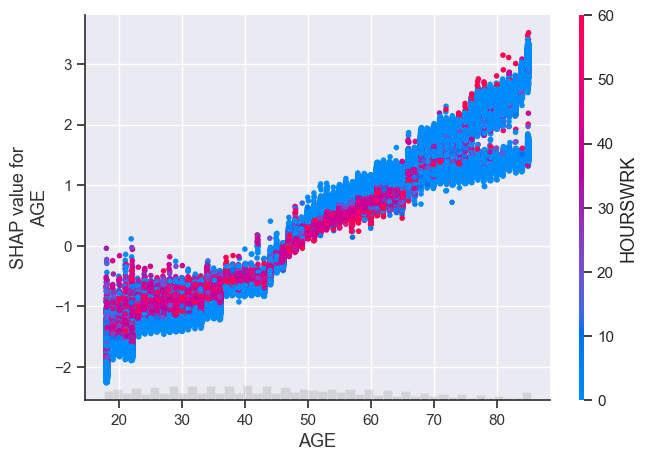

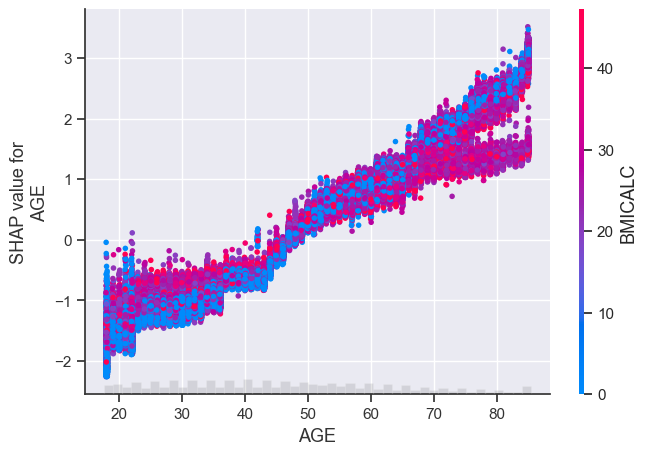

In [32]:
shap.plots.scatter(shap_lgb[:, "AGE"], color=shap_lgb)
shap.plots.scatter(shap_lgb[:, "AGE"], color=shap_lgb[:, "BMICALC"])

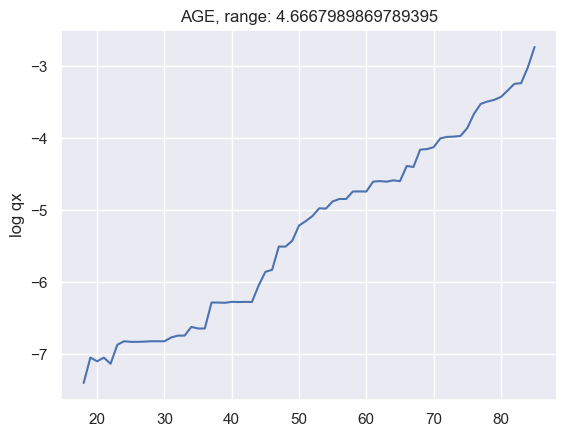

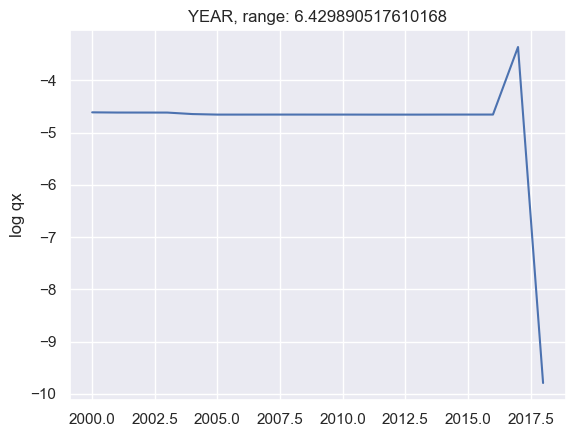

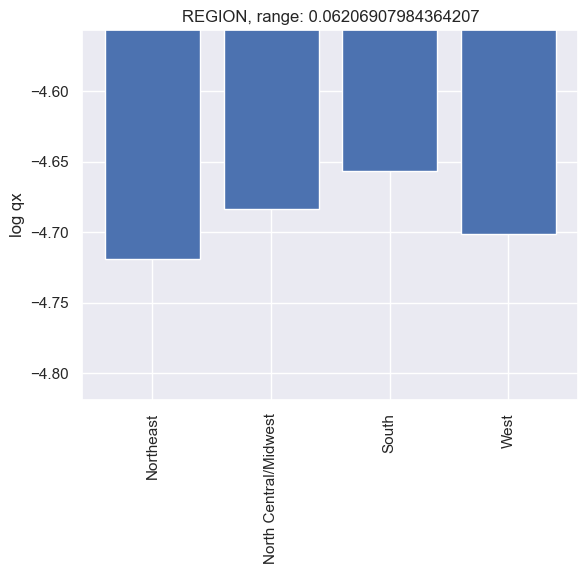

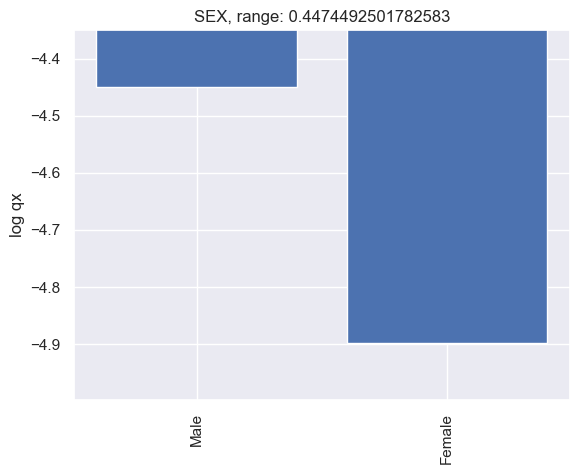

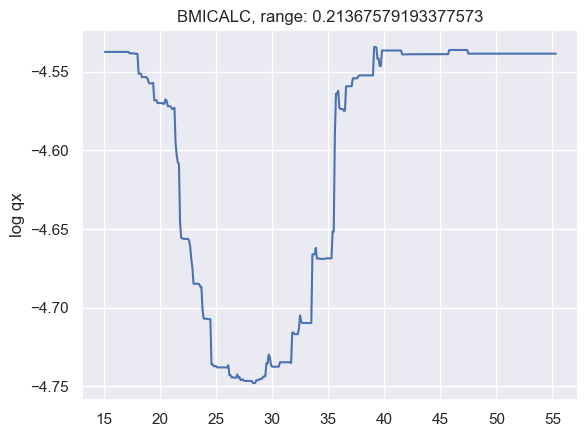

...

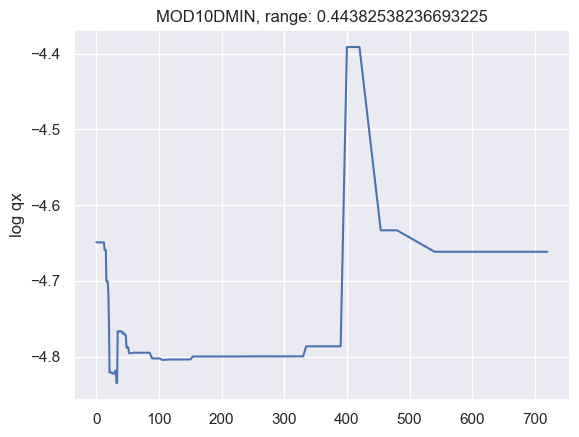

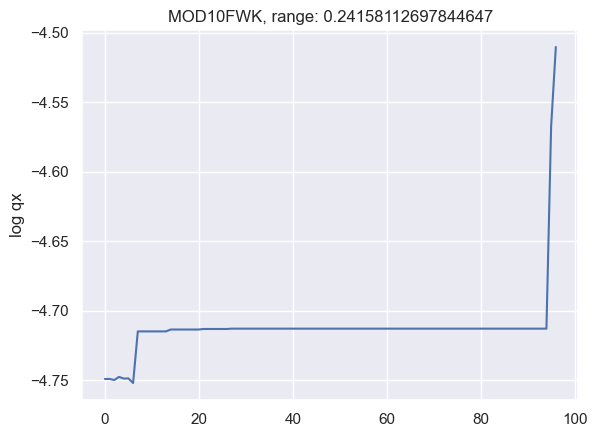

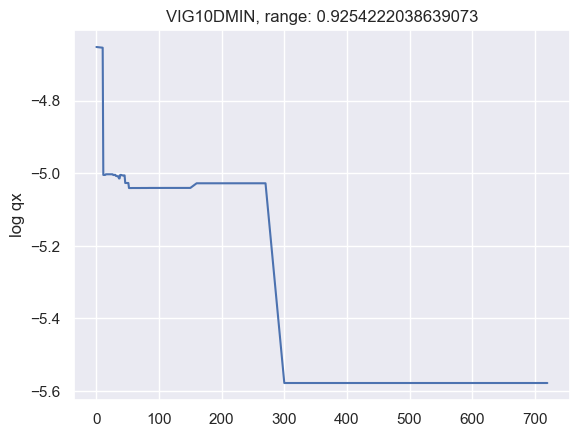

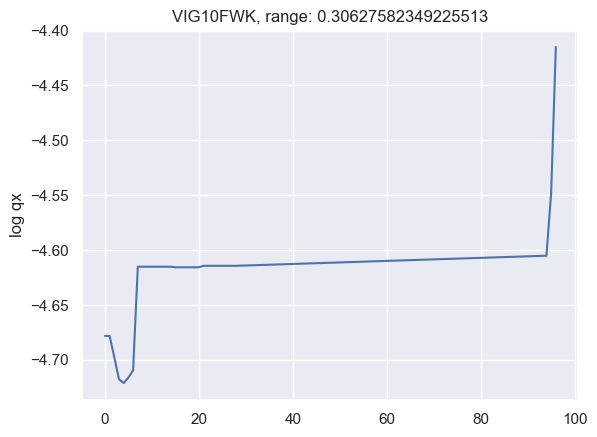

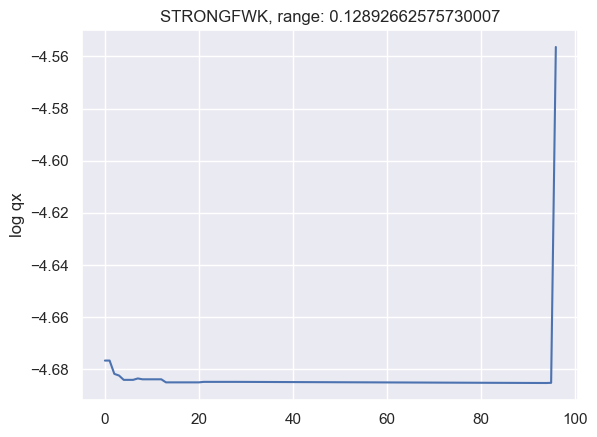

In [33]:
# LightGBM is not compatible with sklearn -> create partial dependence plots manually

for feature in features:
    x_range = df_num[feature].unique()
    if feature == "HRSLEEP":
        x_range = x_range.filter(x_range > 0)
        x_range = x_range.filter(x_range < 14)
    if feature == "BMICALC":
        x_range = x_range.filter(x_range > 15)
        x_range = x_range.filter(x_range < 60)
    if feature == "HOURSWRK":
        x_range = x_range.filter(x_range < 97)
    if feature == "ALCAMT":
        x_range = x_range.filter(x_range > 0)
        x_range = x_range.filter(x_range < 97)
    if feature in ["MOD10DMIN", "VIG10DMIN"]:
        x_range = x_range.filter(x_range < 996)
    if feature in ["MOD10FWK", "VIG10FWK", "STRONGFWK"]:
        x_range = x_range.filter(x_range < 97)
    Xm = df_num.select(features + ["survival"]).to_pandas()
    if feature in ["DEPFEELEVL", "DEPRX", "DEPFREQ", "WORFEELEVL", "WORRX"]:
        x_range = x_range.filter(x_range >= 0)
    if feature == "earnings_quantile":
        x_range = np.arange(0, 1, 0.02)
    _, Xm = train_test_split(Xm, test_size=0.05, random_state=0)
    y = np.zeros(len(x_range))
    for j, x in enumerate(x_range):
        Xm[feature] = x
        y[j] = lgb_model.predict(Xm).mean()
    if feature in categorical_features:
        fig, ax = plt.subplots()
        plt.title(feature + ", range: " + str(np.max(np.log(y)) - np.min(np.log(y))))
        plt.bar(range(len(x_range)), np.log(y))
        ax.set_xticks(range(len(x_range)))
        ax.set_xticklabels([mapDesc(feature)[x] for x in x_range])
        ax.set_ylim([np.min(np.log(y)) - 0.1, np.max(np.log(y)) + 0.1])
        ax.set_ylabel("log qx")
        plt.xticks(rotation=90)
        plt.show()
    else:
        plt.figure()
        plt.title(feature + ", range: " + str(np.max(np.log(y)) - np.min(np.log(y))))
        plt.plot(x_range, np.log(y))
        plt.ylabel("log qx")
        plt.show()

# 3 Second model: combining Cox regression and LightGBM

We explore whether a time-to-event/survival model like Cox regression can improve the LightGBM model. For the Cox model, we add BMI squared and hours of sleep squared as additional covariates, since mortality depends on these variables in a U-shape.

<lifelines.CoxPHFitter: fitted with 1.06859e+06 total observations, 946735 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 1.06859e+06
number of events observed = 121853
   partial log-likelihood = -1545586.34
         time fit was run = 2025-08-13 20:17:24 UTC

---
                   coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                          
AGE                0.07      1.08      0.00            0.07            0.07                1.08                1.08
YEAR              -0.15      0.86      0.00           -0.15           -0.15                0.86                0.86
REGION             0.01      1.01      0.00            0.00            0.01                1.00                1.01
SEX               -0.44      0.64      0.01           -0.45           -0.43                0.64                0.65
BMICALC           -0.01      0.99      0.00           -0.01           -0.01                0.99                0.99
SMOKESTATUS2       0.35      1.42      0.01            0.33            0.36                1.39                1.44
USBORN             0.52      1.68      0.01            0.50            0.53                1.65                1.71
OWNERSHIP         -0.18      0.83      0.01           -0.20           -0.17                0.82                0.84
HIPRIVATEE        -0.13      0.88      0.01           -0.14           -0.12                0.87                0.89
HOURSWRK          -0.01      0.99      0.00           -0.01           -0.01                0.99                0.99
VACFLU12M          0.06      1.06      0.01            0.04            0.08                1.04                1.09
HRSLEEP            0.04      1.04      0.00            0.03            0.04                1.03                1.04
WORFREQ            0.05      1.05      0.04           -0.02            0.12                0.98                1.13
ASAD               0.01      1.01      0.02           -0.04            0.05                0.96                1.05
FAMKIDNO          -0.02      0.98      0.00           -0.03           -0.01                0.97                0.99
MARSTAT           -0.24      0.79      0.01           -0.25           -0.23                0.78                0.80
EDUC              -0.27      0.76      0.01           -0.28           -0.26                0.75                0.77
earnings_quantile -0.80      0.45      0.02           -0.84           -0.75                0.43                0.47
ALCAMT             0.17      1.19      0.04            0.10            0.25                1.10                1.28
DEPFEELEVL        -0.07      0.93      0.04           -0.14           -0.00                0.87                1.00
DEPRX             -0.16      0.86      0.05           -0.25           -0.06                0.78                0.94
DEPFREQ            0.14      1.15      0.04            0.05            0.23                1.05                1.25
WORFEELEVL        -0.24      0.79      0.02           -0.28           -0.19                0.76                0.82
WORRX              0.18      1.20      0.05            0.09            0.28                1.10                1.32
AWORTHLESS         0.11      1.12      0.03            0.06            0.17                1.06                1.18
ARESTLESS          0.03      1.03      0.02           -0.01            0.07                0.99                1.08
ANERVOUS           0.07      1.07      0.02            0.03            0.11                1.03                1.12
AHOPELESS         -0.07      0.93      0.03           -0.13           -0.01                0.88                0.99
AFEELINT1MO        0.22      1.24      0.02            0.18            0.26                1.19                1.29
AEFFORT            0.

Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[479]	train's binary_logloss: 0.0407033	test's binary_logloss: 0.0431222


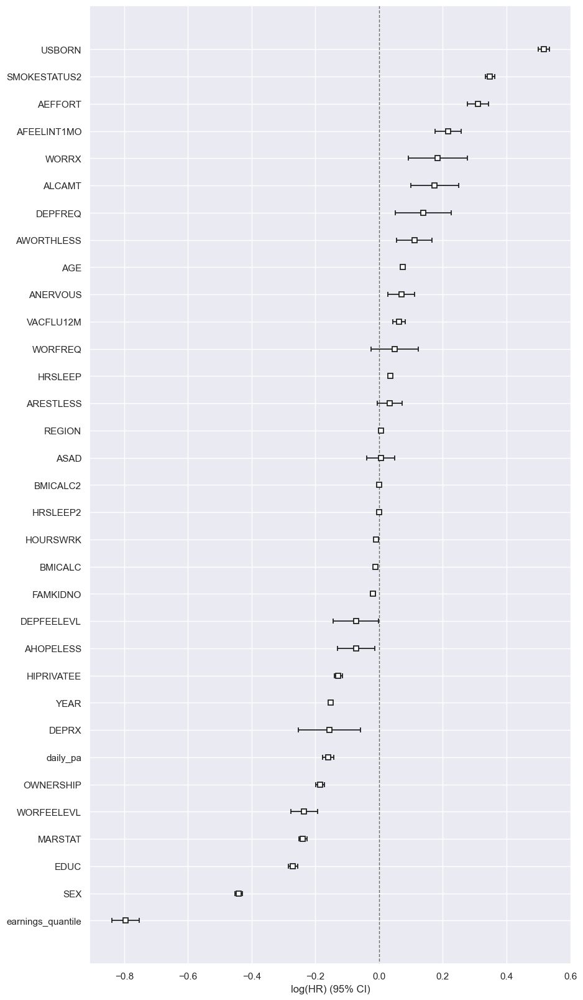

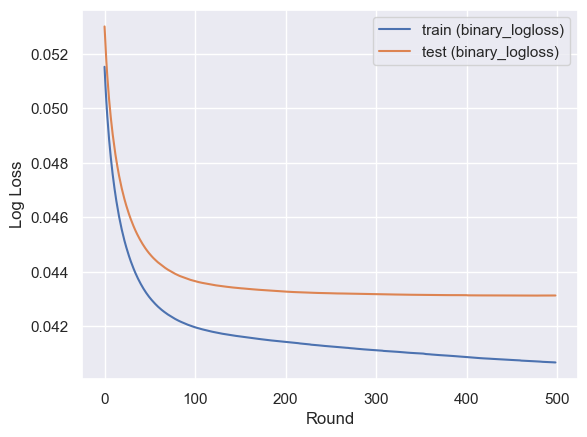

Log loss train: 0.040703345933589374
Log loss test:  0.04312215761478574


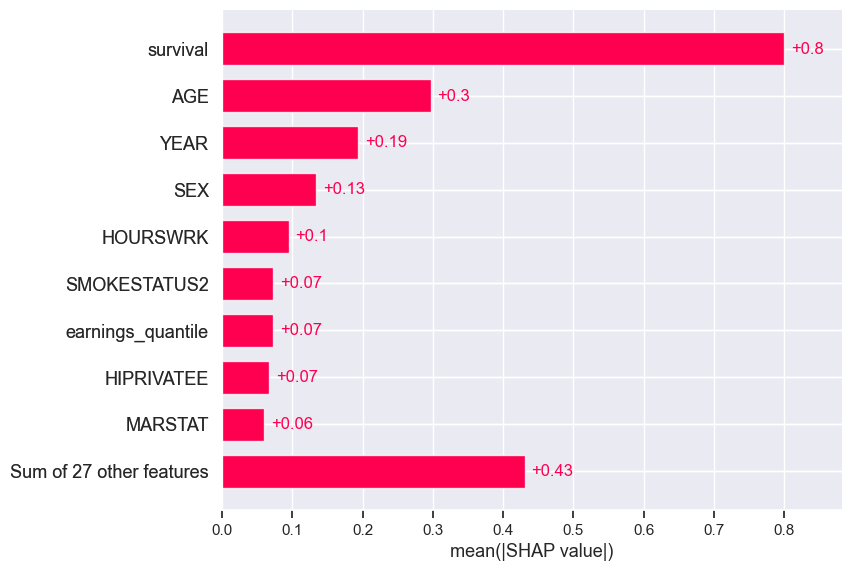

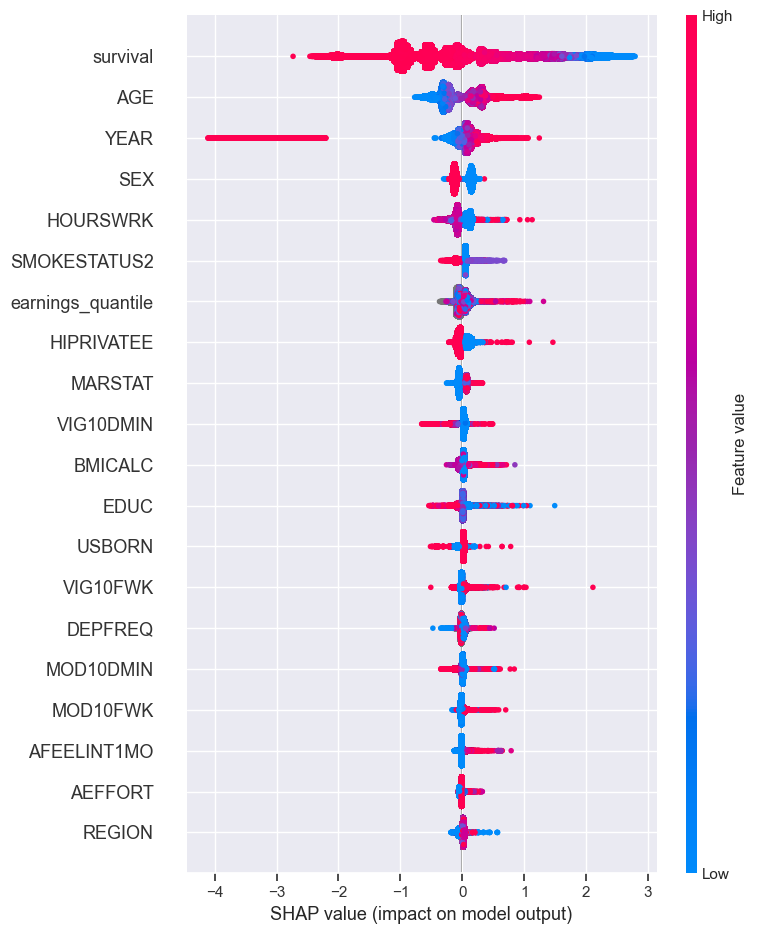

In [34]:
# Use survival probabilities from a Cox model as additional covariate, similar idea as in
# https://www.cambridge.org/core/services/aop-cambridge-core/content/view/66E8BEC373B5CCEF3BF3303D442D6B75/S0515036118000429a.pdf/editorial-yes-we-cann.pdf
# maybe even a bit better idea given the time-to-event aspect

cph = CoxPHFitter()
df_Cox = df_num.select(features + ["time", "event"]).to_pandas()
df_Cox["BMICALC2"] = df_Cox["BMICALC"] ** 2
df_Cox["HRSLEEP2"] = df_Cox["HRSLEEP"] ** 2
df_Cox["SMOKESTATUS2"] = df_Cox["SMOKESTATUS2"].isin(
    [
        10,
        11,
        12,
        13,
        20,
        40,
    ]
)  # has ever smoked
df_Cox["USBORN"] = df_Cox["USBORN"] == 20  # born in the US
df_Cox["OWNERSHIP"] = df_Cox["OWNERSHIP"] == 10  # owning real estate
df_Cox["HIPRIVATEE"] = df_Cox["HIPRIVATEE"].isin([2, 3])  # having private health insurance
df_Cox["VACFLU12M"] = df_Cox["VACFLU12M"].isin([2, 3]) # had flu vaccine
df_Cox["WORFREQ"] = df_Cox["WORFREQ"].isin([1, 2])  # worried daily or weekly
df_Cox["ASAD"] = df_Cox["ASAD"].isin([3, 4]) # feeling sad daily or weekly
df_Cox["MARSTAT"] = df_Cox["MARSTAT"].isin([10, 11])  # married and not separated
df_Cox["EDUC"] = df_Cox["EDUC"].isin(
    [
        302,
        303,
        400,
        500,
        501,
        502,
        503,
        504,
        505,
    ]
)  # higher degree education
df_Cox["ALCAMT"] = (df_Cox["ALCAMT"] > 7) & (df_Cox["ALCAMT"] < 96)  # drinker
df_Cox["DEPFEELEVL"] = df_Cox["DEPFEELEVL"].isin([2, 3]) # feeling depressed
df_Cox["DEPRX"] = df_Cox["DEPRX"] == 2  # taking depression medication
df_Cox["DEPFREQ"] = df_Cox["DEPFREQ"].isin([
    1,
    2,
])  # at least weekly frequency of feeling depressed
df_Cox["WORFEELEVL"] = df_Cox["WORFEELEVL"].isin([2, 3])  # feeling worried
df_Cox["WORRX"] = df_Cox["WORRX"] == 2  # taking medication due to feeling worried
df_Cox["AWORTHLESS"] = df_Cox["AWORTHLESS"].isin([3, 4])  # feeling worthless
df_Cox["ARESTLESS"] = df_Cox["ARESTLESS"].isin([3, 4])  # feeling restless
df_Cox["ANERVOUS"] = df_Cox["ANERVOUS"].isin([3, 4])  # feeling nervous
df_Cox["AHOPELESS"] = df_Cox["AHOPELESS"].isin([3, 4])  # feeling hopeless
df_Cox["AFEELINT1MO"] = df_Cox["AFEELINT1MO"] == 1  # feelings interfered with life
df_Cox["AEFFORT"] = df_Cox["AEFFORT"].isin([3, 4])  # feeling everything an effort
df_Cox["daily_pa"] = df_Cox["MOD10DMIN"] + df_Cox["VIG10DMIN"]
df_Cox["daily_pa"] = (df_Cox["daily_pa"] > 0) & (
    df_Cox["daily_pa"] < 60
)  # daily physical activity > 0min and < 60min
df_Cox = df_Cox.drop(
    columns=["MOD10DMIN", "MOD10FWK", "VIG10DMIN", "VIG10FWK", "STRONGFWK"]
)
df_Cox.loc[df_Cox["earnings_quantile"].isna(), "earnings_quantile"] = 0.5

cph.fit(
    df_Cox,
    duration_col="time",
    event_col="event",
)
cph.print_summary()
plt.figure(figsize=(10, 20))
cph.plot()

df_num = df_num.with_columns(
    (
        pl.Series(
            cph.predict_survival_function(df_Cox, times=[death_year]).T[death_year]
        )
    ).alias("survival")
)

X = df_num.select(features + ["survival"]).to_pandas()
Y = df_num.select(["target"]).to_pandas()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

evals_result = {}
train_data = lgb.Dataset(X_train, label=Y_train)
test_data = lgb.Dataset(X_test, label=Y_test)

lgb_model = lgb.train(
    params,
    train_set=train_data,
    valid_sets=[train_data, test_data],
    valid_names=["train", "test"],
    num_boost_round=200,
    callbacks=[
        lgb.early_stopping(stopping_rounds=20),
        lgb.record_evaluation(evals_result),
    ],
)

plt.figure()
for dataset in evals_result.keys():
    metric_values = evals_result[dataset]["binary_logloss"]
    plt.plot(metric_values, label=f"{dataset} (binary_logloss)")
plt.xlabel("Round")
plt.ylabel("Log Loss")
plt.legend()
plt.show()
print("Log loss train: " + str(log_loss(Y_train, lgb_model.predict(X_train))))
print("Log loss test:  " + str(log_loss(Y_test, lgb_model.predict(X_test))))

lgb_explainer = shap.Explainer(lgb_model)
shap_lgb = lgb_explainer(X_train)
shap.plots.bar(shap_lgb)
shap.summary_plot(shap_lgb, X_train)

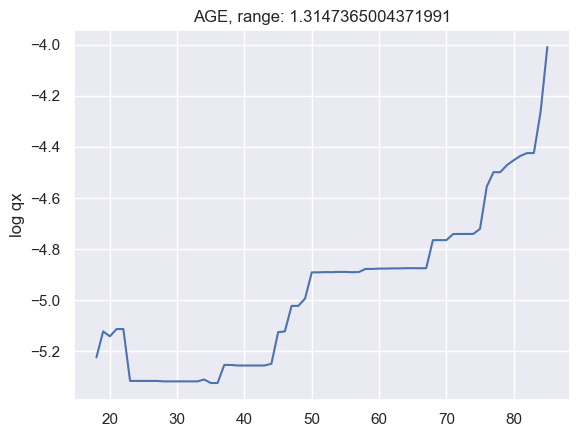

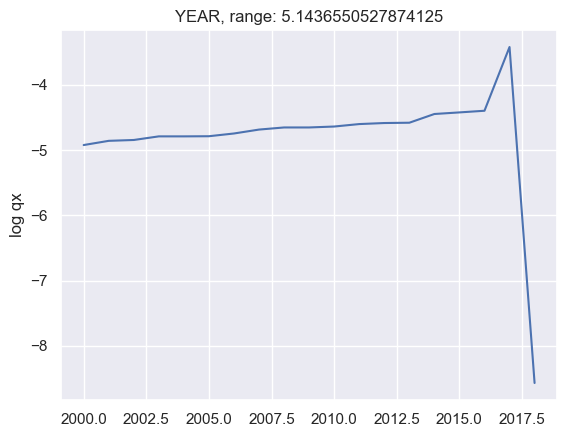

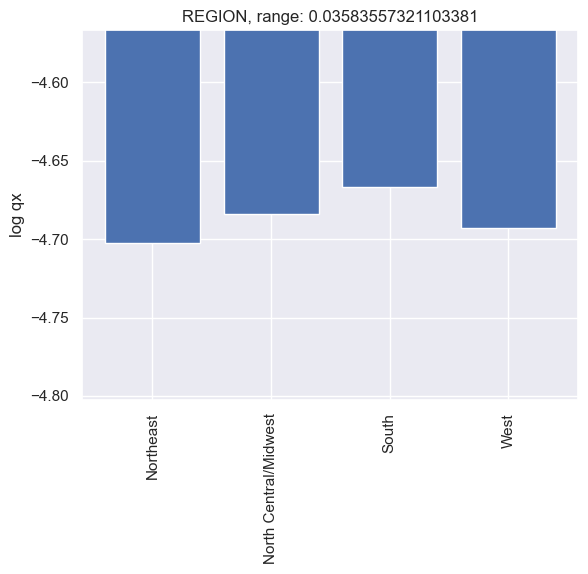

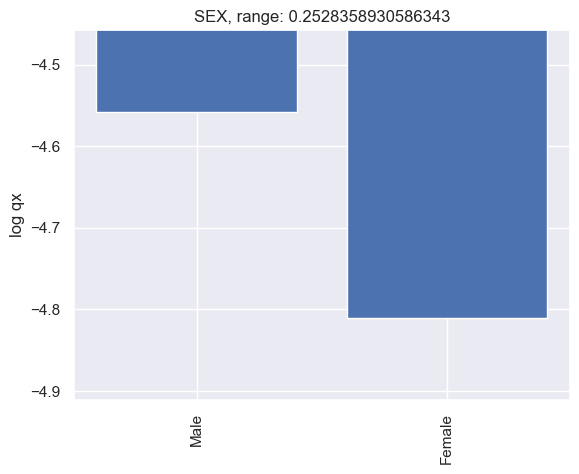

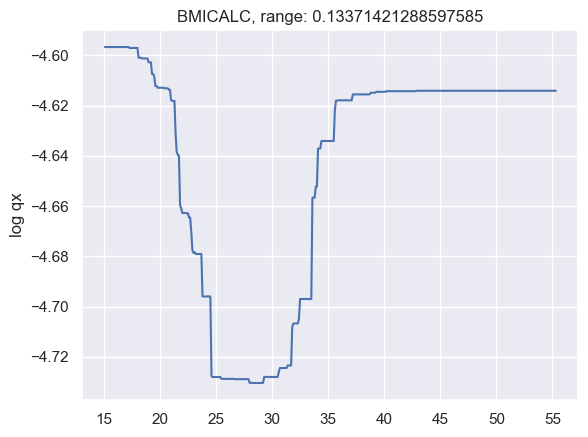

...

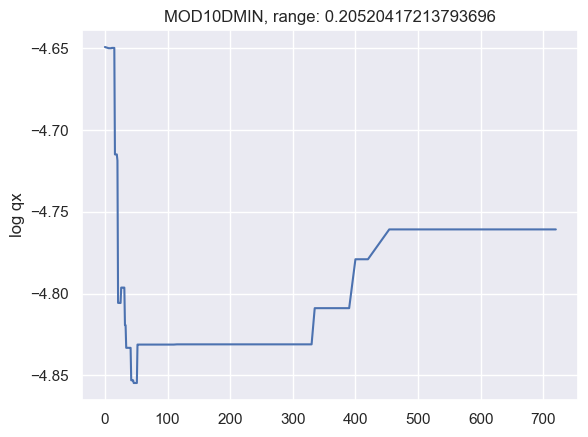

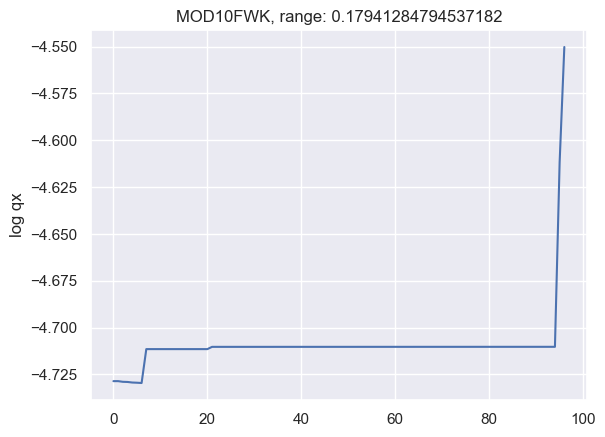

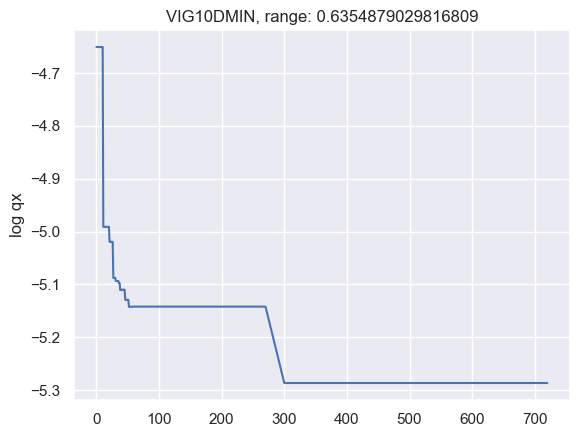

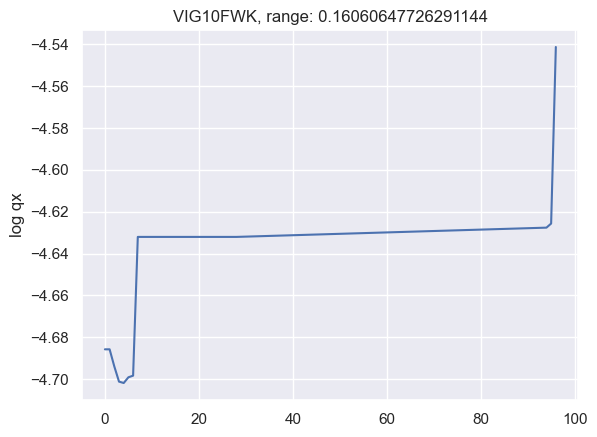

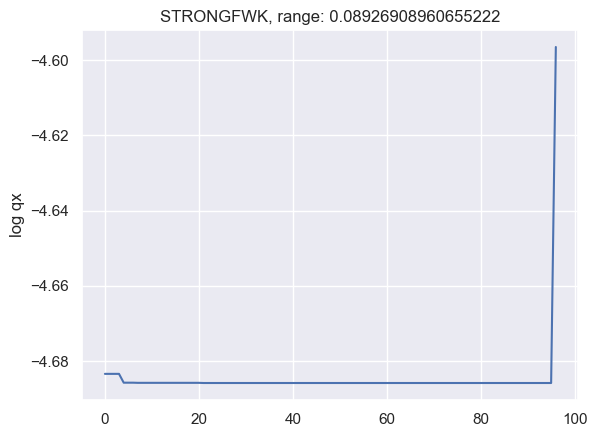

In [35]:
for feature in features:
    x_range = df_num[feature].unique()
    if feature == "HRSLEEP":
        x_range = x_range.filter(x_range > 0)
        x_range = x_range.filter(x_range < 14)
    if feature == "BMICALC":
        x_range = x_range.filter(x_range > 15)
        x_range = x_range.filter(x_range < 60)
    if feature == "HOURSWRK":
        x_range = x_range.filter(x_range < 97)
    if feature == "ALCAMT":
        x_range = x_range.filter(x_range > 0)
        x_range = x_range.filter(x_range < 97)
    if feature in ["MOD10DMIN", "VIG10DMIN"]:
        x_range = x_range.filter(x_range < 996)
    if feature in ["MOD10FWK", "VIG10FWK", "STRONGFWK"]:
        x_range = x_range.filter(x_range < 97)
    Xm = df_num.select(features + ["survival"]).to_pandas()
    if feature in ["DEPFEELEVL", "DEPRX", "DEPFREQ", "WORFEELEVL", "WORRX"]:
        x_range = x_range.filter(x_range >= 0)
    if feature == "earnings_quantile":
        x_range = np.arange(0, 1, 0.02)
    _, Xm = train_test_split(Xm, test_size=0.05, random_state=0)
    y = np.zeros(len(x_range))
    for j, x in enumerate(x_range):
        Xm[feature] = x
        y[j] = lgb_model.predict(Xm).mean()
    if feature in categorical_features:
        fig, ax = plt.subplots()
        plt.title(feature + ", range: " + str(np.max(np.log(y)) - np.min(np.log(y))))
        plt.bar(range(len(x_range)), np.log(y))
        ax.set_xticks(range(len(x_range)))
        ax.set_xticklabels([mapDesc(feature)[x] for x in x_range])
        ax.set_ylim([np.min(np.log(y)) - 0.1, np.max(np.log(y)) + 0.1])
        ax.set_ylabel("log qx")
        plt.xticks(rotation=90)
        plt.show()
    else:
        plt.figure()
        plt.title(feature + ", range: " + str(np.max(np.log(y)) - np.min(np.log(y))))
        plt.plot(x_range, np.log(y))
        plt.ylabel("log qx")
        plt.show()

# 4 Third model: Back to LightGBM - on a smaller subset of covaraties

Choosing a smaller subset of covariates, avoiding similar covariates that are correlated rather strongly.

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[122]	train's binary_logloss: 0.0415603	test's binary_logloss: 0.0433179
Log loss train: 0.041562093916401484
Log loss test:  0.043317890315992015


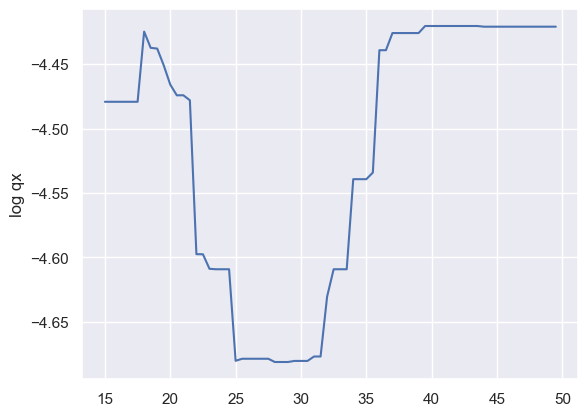

/opt/anaconda3/lib/python3.9/site-packages/kaleido/__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




In [36]:
# Smaller model, focusing on BMI + earnings

features = [
    "AGE",
    "YEAR",
    "REGION",
    "SEX",
    "BMICALC",
    "SMOKESTATUS2",
    "USBORN",
    "OWNERSHIP",
    "HIPRIVATEE",
    #"HOURSWRK",
    #"VACFLU12M",
    "HRSLEEP",
    #"WORFREQ",
    #"ASAD",
    "FAMKIDNO",
    "MARSTAT",
    "EDUC",
    "earnings_quantile",
    #"ALCAMT",
    #"DEPFEELEVL",
    #"DEPRX",
    #"DEPFREQ",
    #"WORFEELEVL",
    #"WORRX",
    #"AWORTHLESS",
    #"ARESTLESS",
    #"ANERVOUS",
    #"AHOPELESS",
    #"AFEELINT1MO",
    #"AEFFORT",
    #"MOD10DMIN",
    #"MOD10FWK",
    #"VIG10DMIN",
    #"VIG10FWK",
    #"STRONGFWK",
]

X = df_num.select(features).to_pandas()
Y = df_num.select(["target"]).to_pandas()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

params = dict(
    learning_rate=0.1,
    objective="binary",
    metric="binary_logloss",
    num_leaves=7,
    verbose=0,
    seed=0,
)

evals_result = {}
train_data = lgb.Dataset(X_train, label=Y_train)
test_data = lgb.Dataset(X_test, label=Y_test)

lgb_model_small = lgb.train(
    params,
    train_set=train_data,
    valid_sets=[train_data, test_data],
    valid_names=["train", "test"],
    num_boost_round=200,
    callbacks=[
        lgb.early_stopping(stopping_rounds=50),
        lgb.record_evaluation(evals_result)
    ],
)

print("Log loss train: " + str(log_loss(Y_train, lgb_model_small.predict(X_train))))
print("Log loss test:  " + str(log_loss(Y_test, lgb_model_small.predict(X_test))))

x_range = np.arange(15,50,0.5)
y = np.zeros(len(x_range))
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.05, random_state=0)
for j, x in enumerate(x_range):
    Xm["BMICALC"] = x
    y[j] = lgb_model_small.predict(Xm).mean()
    
plt.figure()
plt.plot(x_range, np.log(y))
plt.ylabel("log qx")
plt.show()

bmi_range = np.arange(15, 56)
earnings_quantile_range = np.arange(0, 1, 0.02)

mx, my = np.meshgrid(bmi_range, earnings_quantile_range)
z = np.zeros((len(bmi_range), len(earnings_quantile_range)))
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.01, random_state=0)
for j, bmi in enumerate(bmi_range):
    for k, earnings_quantile in enumerate(earnings_quantile_range):
        Xm["BMICALC"] = bmi
        Xm["earnings_quantile"] = earnings_quantile
        z[j, k] = np.log(lgb_model_small.predict(Xm).mean())
fig = go.Figure(data=[go.Surface(z=z, x=earnings_quantile_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale="Jet")
fig.update_layout(
    autosize=True,
    scene=dict(
        xaxis_title="Earnings quantile", yaxis_title="BMI", zaxis_title="log qx"
    ),
    width=1000,
    height=1000,
)
fig.show()

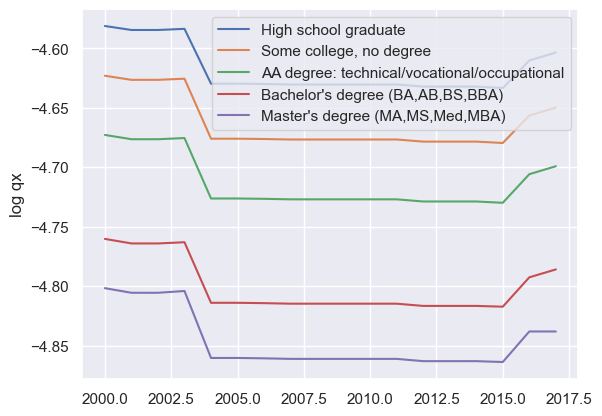

In [37]:
# Trends by education

educations = [201, 301, 302, 400, 501]

feature = "YEAR"
x_range = df_num[feature].unique()[:-1]
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.05, random_state=0)
y = np.zeros(len(x_range))
fig, ax = plt.subplots()
for educ in educations:
    for j, x in enumerate(x_range):
        Xm[feature] = x
        Xm["EDUC"] = educ
        y[j] = lgb_model_small.predict(Xm).mean()
    plt.plot(x_range, np.log(y))
plt.ylabel("log qx")
plt.legend([mapDesc("EDUC")[x] for x in educations])
plt.show()

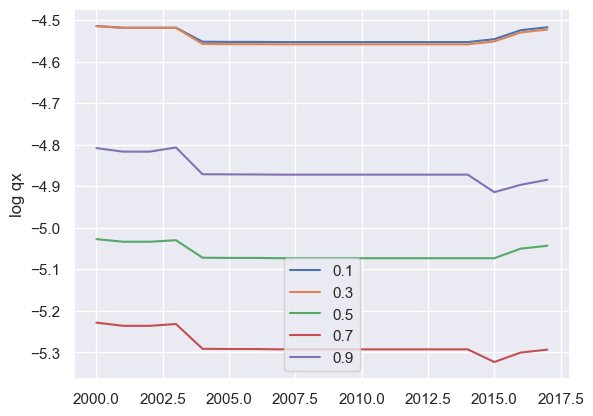

In [38]:
# Trends by earnings

earnings_quantiles = [0.1, 0.3, 0.5, 0.7, 0.9]

feature = "YEAR"
x_range = df_num[feature].unique()[:-1]
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.05, random_state=0)
y = np.zeros(len(x_range))
fig, ax = plt.subplots()
for earnings_quantile in earnings_quantiles:
    for j, x in enumerate(x_range):
        Xm[feature] = x
        Xm["earnings_quantile"] = earnings_quantile
        y[j] = lgb_model_small.predict(Xm).mean()
    plt.plot(x_range, np.log(y))
plt.ylabel("log qx")
plt.legend(earnings_quantiles)
plt.show()

# 5 Saving the final (prepared) dataset

In [39]:
features = [
    "AGE",
    "YEAR",
    "REGION",
    "SEX",
    "BMICALC",
    "SMOKESTATUS2",
    "USBORN",
    "OWNERSHIP",
    "HIPRIVATEE",
    #"HOURSWRK",
    #"VACFLU12M",
    "HRSLEEP",
    #"WORFREQ",
    #"ASAD",
    "FAMKIDNO",
    "MARSTAT",
    "EDUC",
    "earnings_quantile",
    #"ALCAMT",
    #"DEPFEELEVL",
    #"DEPRX",
    #"DEPFREQ",
    #"WORFEELEVL",
    #"WORRX",
    #"AWORTHLESS",
    #"ARESTLESS",
    #"ANERVOUS",
    #"AHOPELESS",
    #"AFEELINT1MO",
    #"AEFFORT",
    #"MOD10DMIN",
    #"MOD10FWK",
    #"VIG10DMIN",
    #"VIG10FWK",
    #"STRONGFWK",
]

df = df_num.select(features+['time' , 'event'])
df = df.with_columns(pl.col('earnings_quantile').cast(pl.Float64))
df = df.with_columns(df['REGION'].to_dummies(drop_first=True))
df = df.with_columns(pl.col('SEX').is_in([1]).alias('MALE'))
df = df.with_columns(pl.col('MARSTAT').is_in([10, 11]))
df = df.with_columns(pl.col('USBORN').is_in([20]))
df = df.with_columns(pl.col('HIPRIVATEE').is_in([2, 3]))
df = df.with_columns(pl.col('EDUC').is_in([302, 303, 400, 500, 510, 520, 521, 522]))
df = df.with_columns(pl.col("HRSLEEP").replace([0], None))
df = df.with_columns(pl.col("HRSLEEP").clip(1, 16))
df = df.with_columns(pl.col('SMOKESTATUS2').is_in([11, 12]))
df = df.with_columns(pl.col("BMICALC").replace([0, 996], None))
df = df.with_columns(pl.col("BMICALC").clip(15, 50))
df = df.with_columns(pl.col("time").clip(0, 20))
df = df.drop(['REGION','SEX','OWNERSHIP'])

df.write_csv("data/prepared_data.csv", separator=",")

Model trained...
Log loss train: 8.769618239989324
Log loss test:  9.150355608531438


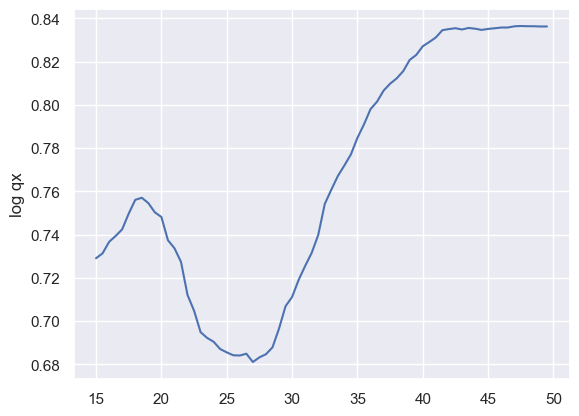

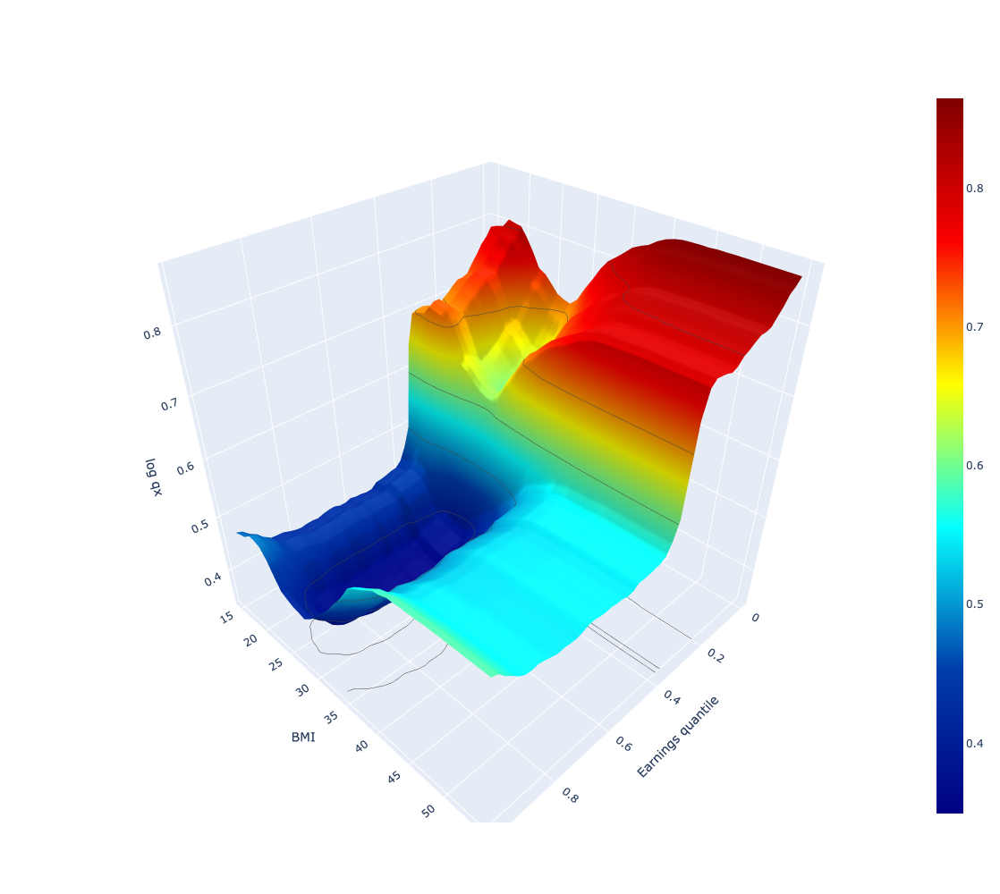

In [40]:
# Random survival forests

features = [
    "AGE",
    "YEAR",
    "REGION",
    "SEX",
    "BMICALC",
    "SMOKESTATUS2",
    "USBORN",
    "OWNERSHIP",
    "HIPRIVATEE",
    #"HOURSWRK",
    #"VACFLU12M",
    "HRSLEEP",
    #"WORFREQ",
    #"ASAD",
    "FAMKIDNO",
    "MARSTAT",
    "EDUC",
    "earnings_quantile",
    #"ALCAMT",
    #"DEPFEELEVL",
    #"DEPRX",
    #"DEPFREQ",
    #"WORFEELEVL",
    #"WORRX",
    #"AWORTHLESS",
    #"ARESTLESS",
    #"ANERVOUS",
    #"AHOPELESS",
    #"AFEELINT1MO",
    #"AEFFORT",
    #"MOD10DMIN",
    #"MOD10FWK",
    #"VIG10DMIN",
    #"VIG10FWK",
    #"STRONGFWK",
]

X = df_num.select(features).to_pandas()
Y = df_num.select(["event", "time"]).to_pandas()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.90, random_state=0)

rsf = RandomSurvivalForest(
    n_estimators=1000, min_samples_split=10, min_samples_leaf=15, n_jobs=-1, random_state=0
)
rsf.fit(X_train, Y_train.to_records(index=False))

print("Log loss train: " + str(log_loss(Y_train.event, rsf.predict(X_train))))
print("Log loss test:  " + str(log_loss(Y_test.event, rsf.predict(X_test))))

x_range = np.arange(15,50,0.5)
y = np.zeros(len(x_range))
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.005, random_state=0)
for j, x in enumerate(x_range):
    Xm["BMICALC"] = x
    y[j] = rsf.predict(Xm).mean()
    
plt.figure()
plt.plot(x_range, np.log(y))
plt.ylabel("log qx")
plt.show()

bmi_range = np.arange(15, 56)
earnings_quantile_range = np.arange(0, 1, 0.02)

mx, my = np.meshgrid(bmi_range, earnings_quantile_range)
z = np.zeros((len(bmi_range), len(earnings_quantile_range)))
Xm = df_num.select(features).to_pandas()
_, Xm = train_test_split(Xm, test_size=0.001, random_state=0)
for j, bmi in enumerate(bmi_range):
    for k, earnings_quantile in enumerate(earnings_quantile_range):
        Xm["BMICALC"] = bmi
        Xm["earnings_quantile"] = earnings_quantile
        z[j, k] = np.log(rsf.predict(Xm).mean())
fig = go.Figure(data=[go.Surface(z=z, x=earnings_quantile_range, y=bmi_range)])
fig.update_traces(contours_z=dict(show=True, project_z=True), colorscale="Jet")
fig.update_layout(
    autosize=True,
    scene=dict(
        xaxis_title="Earnings quantile", yaxis_title="BMI", zaxis_title="log qx"
    ),
    width=1000,
    height=1000,
)
fig.show()